**Armando Nicolás Acuña Zambrano**

# Proyecto 1

El objetivo principal del proyecto es aplicar el desarrollo del Deep Learning para realizar la clasificación de imágenes. En particular, utilizando el dataset CIFAR-10, que consta de 60.000 imágenes en color de 32x32 de 10 clases de objetos diferentes (6.000 imágenes por clase).

El dataset está estructurado de la siguiente forma:
* 40.000 imágenes de entrenamiento (etiquetadas)
* 10.000 imágenes de validación (etiquetadas)
* 10.000 imágenes de prueba (no etiquetadas)

Todos los dataset contienen un número equilibrado de imágenes por clase.

EL desarrollo del proyecto debe debe contener:
* Diseñar al menos un modelo desde desde cero.
* Aplicar al menos 3 modelo preentrenados de Transfer Learning.

Para analizar e informar los resultados de los enfoques, se deben utilizar las métricas obtenidas del conjunto de validación, teniendo en cuenta que, las imágenes de validación no se pueden utilizar para entrenamiento. Luego, de seleccionar el mejor modelo (pueder unir el conjunto de validación al de entrenamiento para el modelo final), deberá proporcionar los resultados en el conjunto de prueba para poder evaluar de forma independiente el rendimiento de los algoritmos.

**Objetivos**
* Implementar al menos un modelo desde cero para la clasificación de imágenes.
* Utilizar el Transfer Learning para la clasificación de imágenes (al menos tres arquitecturas diferentes). Se recomienda comenzar con modelos simples (ej. VGG19) con todas las capas convolucionales congeladas. Luego, intentar mejorar los resultados ajustando los hiperparámetros (epochs, batches, learning rate, data augmentation, etc.) mientras se prueban diferentes modelos y otras estrategias de Tranfer Learning (ej. descongelar algunas capas).
* Extraer métricas de evaluación de las imágenes proporcionadas (conjuntos de entrenamiento y validación). Para analizar e informar los resultados de sus enfoques, se debe utilizar el conjunto de validación y mostrar métricas y gráficos (loss, accuracy, confusion matrix, etc.). En esta parte, las imágenes de validación no se pueden utilizar para entrenamiento.
* Enviar un resultado final para el conjunto de prueba con su "mejor" modelo final. Usaremos los resultados de este conjunto de pruebas para evaluar de forma independiente sus algoritmos.
* Documentación, informar todas las pruebas y experimentos, y analizar y explicar la mejora en cada paso.

In [ ]:
#Importar las librerias necesarias
import shutil
import os
import matplotlib.pyplot as plt
import random
import pandas as pd

from sklearn.metrics import precision_score, recall_score
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
#Como es el primer encuentro con Deep Learning, se utilizó en consejo que trabajar con fast.ai
from fastai.vision.all import *

In [ ]:
#Buscar el dataset en el drive y extraer los archivos
ruta_drive = '/content/drive/MyDrive/Colab Notebooks/MSc_Data_Science/AML/Deep_learning/dataset_CIFAR10.zip'
ruta_colab = '/content/dataset_CIFAR10.zip'
shutil.copyfile(ruta_drive, ruta_colab)

path = '/content/'
shutil.unpack_archive(ruta_colab, path)

In [ ]:
img_size = 224 #Redimensionamiento de las imágenes
batch_size = 256 #Tamaño del lote

In [ ]:
#Definición del DataBlock
dblock = DataBlock(blocks=(ImageBlock, CategoryBlock), #Tipos de datos que contendrá DataBlock; imágenes (datos de entrada), etiquetas (categoría)
                   get_items=get_image_files, #Archivos
                   splitter=GrandparentSplitter(train_name='train', #División de los datos, y nombre de las carpetas
                                                valid_name='validation' ),
                   get_y=parent_label, #Nombre de las etiquetas a partir de los nombres de las carpetas
                   item_tfms=[Resize(img_size)], #Transformación
                   batch_tfms=aug_transforms()                  ) #Tranformación

In [ ]:
#Creación del DataLoaders
dls = dblock.dataloaders(path,
                         bs=batch_size,  #Tamaño del lote
                         verbose=True,
                         device=torch.device('cuda') )  #Utilizar la GPU para mejora del rendimiento

Found 57608 items
2 datasets of sizes 40000,10000
Setting up Pipeline: PILBase.create
Setting up Pipeline: parent_label -> Categorize -- {'vocab': None, 'sort': True, 'add_na': False}
Setting up after_item: Pipeline: Resize -- {'size': (224, 224), 'method': 'crop', 'pad_mode': 'reflection', 'resamples': (<Resampling.BILINEAR: 2>, <Resampling.NEAREST: 0>), 'p': 1.0} -> ToTensor
Setting up before_batch: Pipeline: 
Setting up after_batch: Pipeline: IntToFloatTensor -- {'div': 255.0, 'div_mask': 1} -> Flip -- {'size': None, 'mode': 'bilinear', 'pad_mode': 'reflection', 'mode_mask': 'nearest', 'align_corners': True, 'p': 0.5} -> Brightness -- {'max_lighting': 0.2, 'p': 1.0, 'draw': None, 'batch': False}


In [ ]:
nom_classes = dls.vocab #Nombre de las clases únicas
print(nom_classes)

n_classes = dls.c #Número de clases
print(n_classes)

['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']
10


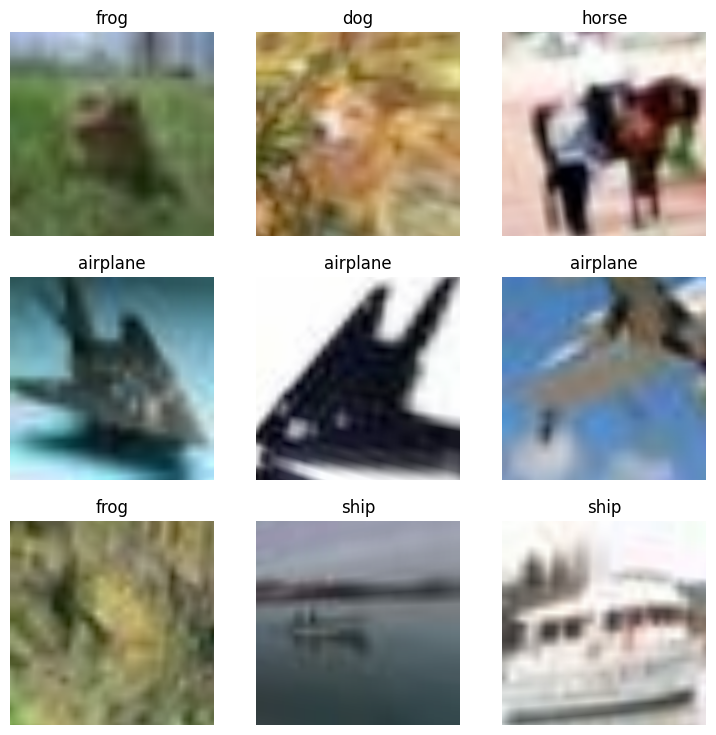

In [ ]:
dls.train.show_batch() #Vista del conjunto de entrenamiento

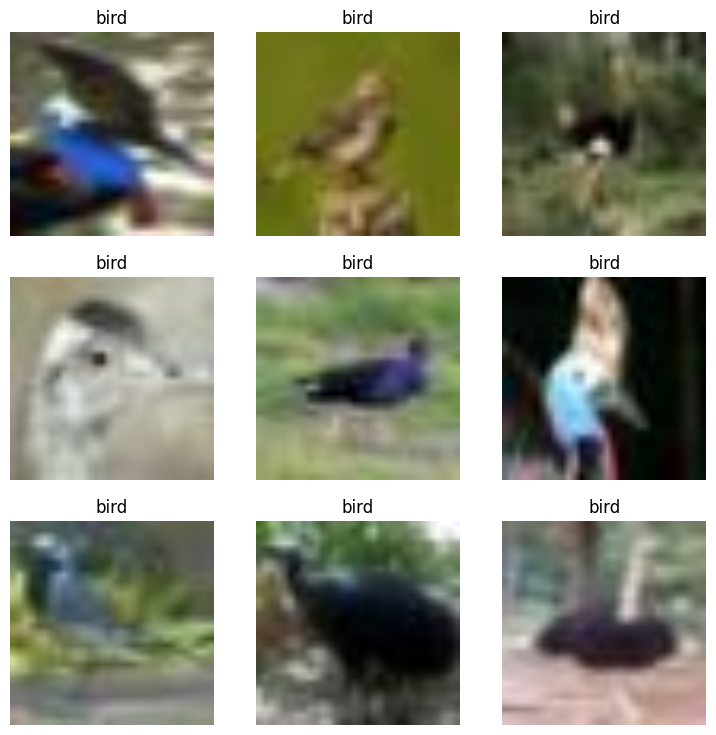

In [ ]:
dls.valid.show_batch() #Vista del conjunto de validación

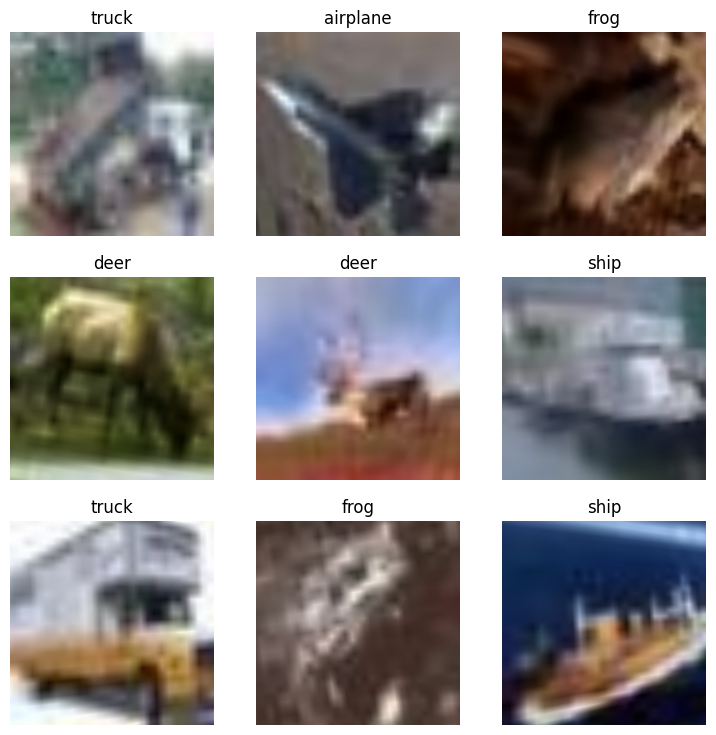

In [ ]:
dls.show_batch() #Vista de los conjuntos de entrenamiento y validación

## Primer Modelo (Desde Cero)

El modelo elaborado desde cero, implementa una red neuronal convolucional (CNN).Comienza con una capa convolucional seguida de una función de activación ReLU y una capa de agrupación máxima para reducir la resolución espacial de la entrada. Luego, sigue con otra capa convolucional, función de activación ReLU y agrupación máxima. Después de estas capas convolucionales, el modelo utiliza una capa flatten (aplanado) para convertir la salida de las capas convolucionales en un vector unidimensional, para luego, seguir con capas lineales (fully connected) con funciones de activación ReLU. La última capa del modelo es otra capa lineal, que tiene el número de clases como salida, esta capa proporciona las puntuaciones de clase para cada clase posible en el problema de clasificación.

El modelo se entrena utilizando el método fit_one_cycle, que es una técnica de entrenamiento popular en Fastai que ajusta automáticamente la tasa de aprendizaje durante el entrenamiento para mejorar el rendimiento del modelo. Además, se utiliza el método fine_tune para realizar un ajuste fino del modelo en el conjunto de datos específico, lo que puede mejorar aún más su rendimiento.

In [ ]:
#Creación del modelo
model_scratch = nn.Sequential(
    #Primera Capa Convolucional
    nn.Conv2d(in_channels=3, out_channels=16, kernel_size=3, stride=1, padding=0), #Capa de convolución que convierte la entrada (imágenes, 3 canales de color)
                                                                                          #en características convolucionales utilizando 16 filtros de 3x3
    nn.ReLU(), #Función de activación ReLU
    nn.MaxPool2d(kernel_size=2, stride=2), #Capa pooling, reduce el tamaño espacial

    #Segunda Capa Convolucional
    nn.Conv2d(in_channels=16, out_channels=32, kernel_size=3, stride=1, padding=0), #Capa de convolución que convierte un tensor (16 canales)
                                                                                          #en uno de 32 filtros de 3x3
    nn.ReLU(), #Función de activación ReLU
    nn.MaxPool2d(kernel_size=2, stride=2), #Capa pooling, reduce el tamaño espacial

    #Capa Fully Connected
    nn.Flatten(), #Aplanar salida de la capa convolucional
    nn.Linear(32 * 54 * 54, 128), #Capa lineal con 128 neuronas
    nn.ReLU(), #Función de activación ReLU

    #Capa de Salida
    nn.Linear(128, n_classes) ) #Capa lineal con el número de clases como salida

In [ ]:
#Configuración del modelo
learn_scratch = Learner(
                       dls , #Conjuntos de Entrenamiento y Validación
                       model_scratch, #Modelo
                       splitter=default_split, #Función predeterminada que divide los parámetros en dos grupos
                       loss_func=CrossEntropyLossFlat(), #Función de pérdida, función de pérdida de entropía cruzada plana (clasificación multiclase)
                       metrics=[accuracy], #Metricas de evaluación del modelo
                       )

In [ ]:
epochs = 10 #Número de épocas
learn_scratch.fit_one_cycle(epochs, lr_max = 1e-3) #Entrenamiento

epoch,train_loss,valid_loss,accuracy,time
0,1.916980,1.793701,0.361200,01:54
1,1.685266,1.603455,0.436700,01:54
2,1.555817,1.461677,0.482600,01:54
3,1.449342,1.381204,0.508700,01:54
4,1.383145,1.342566,0.521100,01:54
5,1.334351,1.284080,0.550400,02:02
6,1.286264,1.257460,0.556000,02:22
7,1.266945,1.235063,0.565100,02:50
8,1.241482,1.232191,0.569700,02:22
9,1.222480,1.225997,0.572100,02:05


In [ ]:
preds_scratch, targets_scratch = learn_scratch.get_preds()
pred_labels_scratch = preds_scratch.argmax(dim=1) #Predicciones de probabilidades a etiquetas predichas

#Precisión y Recall para cada Clase
precision_per_class_scratch = precision_score(targets_scratch, pred_labels_scratch, average=None)
recall_per_class_scratch = recall_score(targets_scratch, pred_labels_scratch, average=None)

#Precisión y Recall micro-average
precision_micro_scratch = precision_score(targets_scratch, pred_labels_scratch, average='micro')
recall_micro_scratch = recall_score(targets_scratch, pred_labels_scratch, average='micro')

#Precisión y Recall macro-average
precision_macro_scratch = precision_score(targets_scratch, pred_labels_scratch, average='macro')
recall_macro_scratch = recall_score(targets_scratch, pred_labels_scratch, average='macro')
print("Precisión por Clase:", precision_per_class_scratch)
print("Recall por Clase:", recall_per_class_scratch)
print("Micro-average Precisión:", precision_micro_scratch)
print("Micro-average Recall:", recall_micro_scratch)
print("Macro-average Precisión:", precision_macro_scratch)
print("Macro-average Recall:", recall_macro_scratch)

Precisión por Clase: [0.62003968 0.64361702 0.47308133 0.44617225 0.51760939 0.51533019
 0.56569966 0.58235824 0.67920978 0.61523438]
Recall por Clase: [0.625 0.726 0.413 0.373 0.485 0.437 0.663 0.647 0.722 0.63 ]
Micro-average Precisión: 0.5721
Micro-average Recall: 0.5721
Macro-average Precisión: 0.565835191488423
Macro-average Recall: 0.5720999999999999


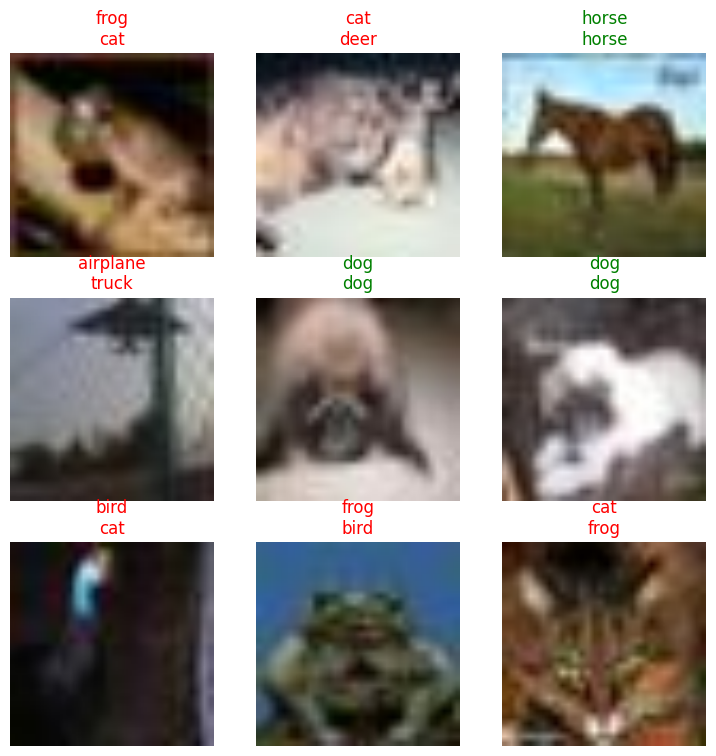

In [ ]:
learn_scratch.show_results() #Visualización de los resultados

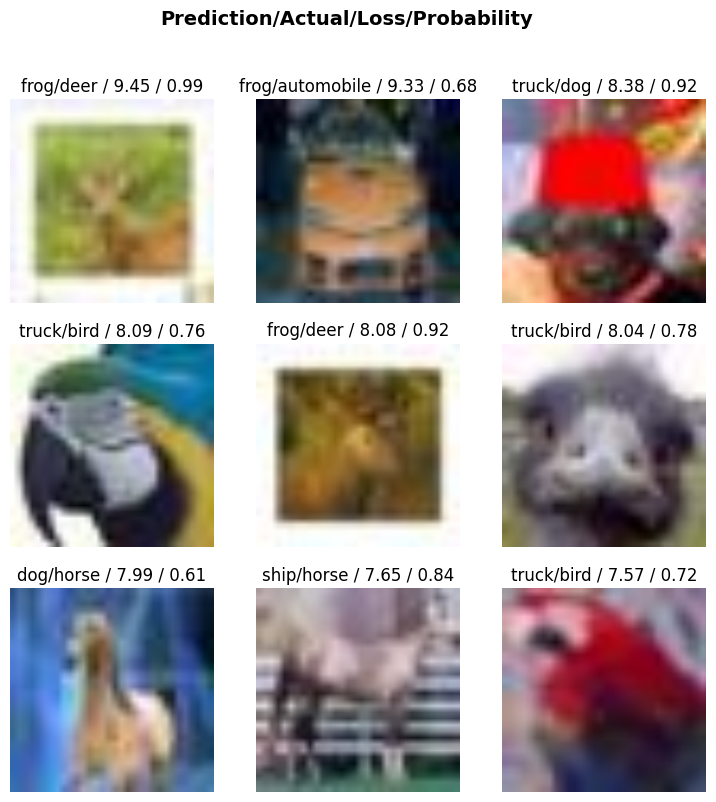

In [ ]:
interp_scratch = Interpretation.from_learner(learn_scratch) #Interpretar y visualizar resultados
interp_scratch.plot_top_losses(9) #Visualiación de las 9 muestras con pérdidas más altas

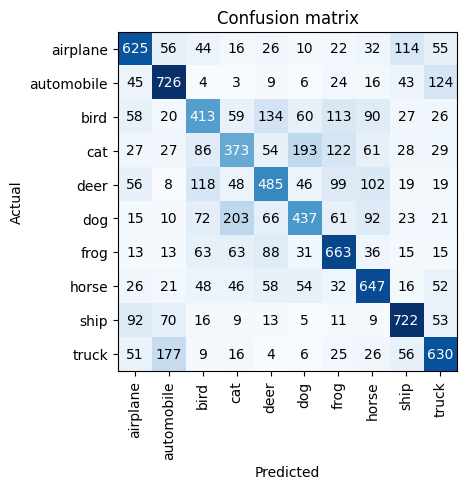

In [ ]:
interp_scratch = ClassificationInterpretation.from_learner(learn_scratch) #Interpretar y visualizar resultados
interp_scratch.plot_confusion_matrix() #Matriz de confusión

In [ ]:
"""
Luego del entrenamiento inicial con learn_scratch.fit_one_cycle donde se estabiliza el entrenamiento
    se aplica learn_scratch.fine_tune para ajustar los pesos del modelo,
    en lugar de entrenar todas las capas del modelo desde cero, donde congela las capas base y solo entrena las capas superiores
"""

learn_scratch.fine_tune(epochs, base_lr = 1e-3)

epoch,train_loss,valid_loss,accuracy,time
0,1.284808,1.272426,0.548700,02:14


epoch,train_loss,valid_loss,accuracy,time
0,1.236919,1.227865,0.567200,02:24
1,1.228912,1.214430,0.567000,02:00
2,1.230432,1.215906,0.573900,02:15
3,1.218706,1.214353,0.572300,02:40
4,1.200866,1.210311,0.568100,02:29
5,1.188023,1.194388,0.579700,02:06
6,1.167841,1.175355,0.585600,01:55
7,1.153620,1.161452,0.590500,01:55
8,1.132325,1.160746,0.593300,01:55
9,1.131957,1.160038,0.594500,01:54


In [ ]:
preds_scratch, targets_scratch = learn_scratch.get_preds()
pred_labels_scratch = preds_scratch.argmax(dim=1) #Predicciones de probabilidades a etiquetas predichas

#Precisión y Recall para cada Clase
precision_per_class_scratch = precision_score(targets_scratch, pred_labels_scratch, average=None)
recall_per_class_scratch = recall_score(targets_scratch, pred_labels_scratch, average=None)

#Precisión y Recall micro-average
precision_micro_scratch = precision_score(targets_scratch, pred_labels_scratch, average='micro')
recall_micro_scratch = recall_score(targets_scratch, pred_labels_scratch, average='micro')

#Precisión y Recall macro-average
precision_macro_scratch = precision_score(targets_scratch, pred_labels_scratch, average='macro')
recall_macro_scratch = recall_score(targets_scratch, pred_labels_scratch, average='macro')
print("Precisión por Clase:", precision_per_class_scratch)
print("Recall por Clase:", recall_per_class_scratch)
print("Micro-average Precisión:", precision_micro_scratch)
print("Micro-average Recall:", recall_micro_scratch)
print("Macro-average Precisión:", precision_macro_scratch)
print("Macro-average Recall:", recall_macro_scratch)

Precisión por Clase: [0.64646465 0.6634016  0.4895719  0.46223224 0.53250774 0.54252874
 0.61842105 0.59855986 0.70104068 0.64047151]
Recall por Clase: [0.64  0.745 0.446 0.41  0.516 0.472 0.658 0.665 0.741 0.652]
Micro-average Precisión: 0.5945
Micro-average Recall: 0.5945
Macro-average Precisión: 0.5895199969974417
Macro-average Recall: 0.5944999999999999


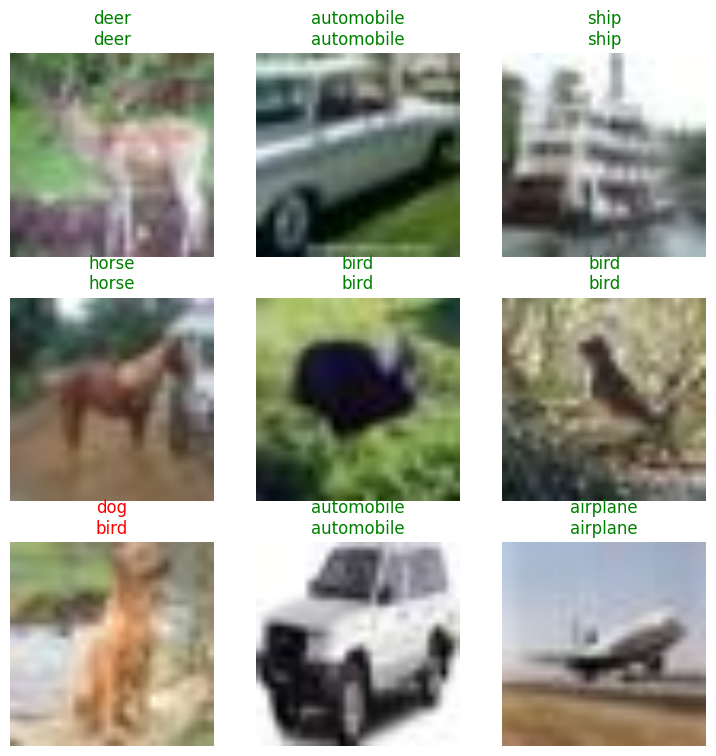

In [ ]:
learn_scratch.show_results() #Visualización de los resultados

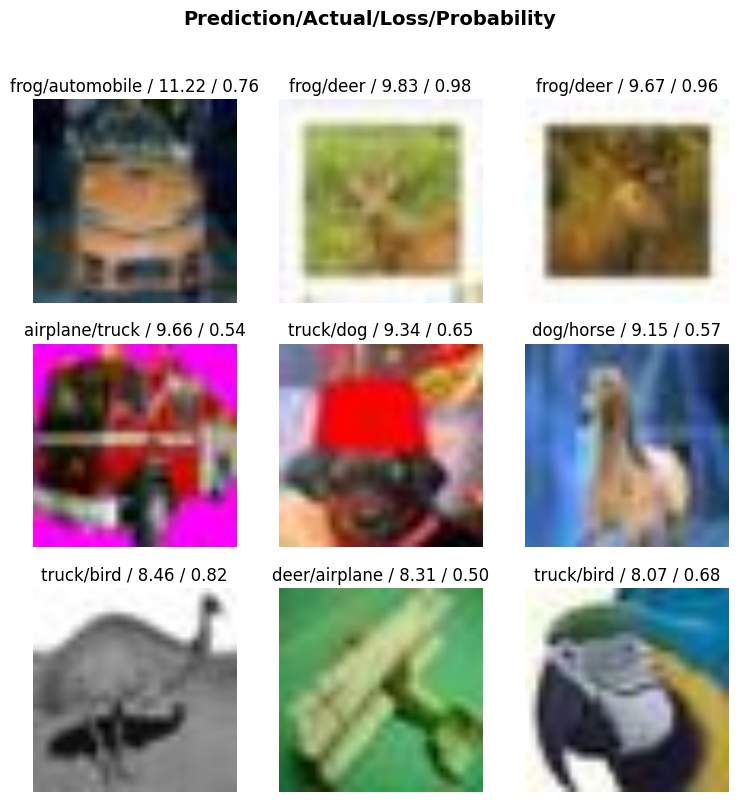

In [ ]:
interp_scratch = Interpretation.from_learner(learn_scratch) #Interpretar y visualizar resultados
interp_scratch.plot_top_losses(9) #Visualiación de las 9 muestras con pérdidas más altas

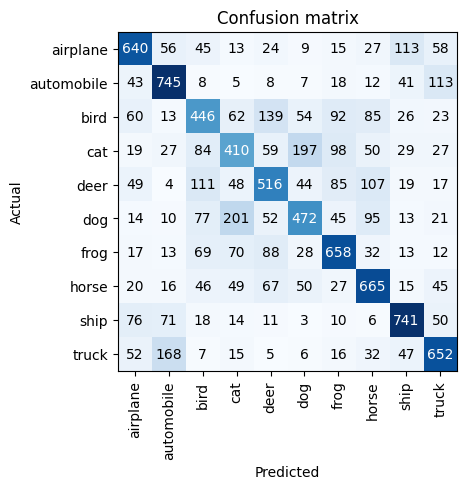

In [ ]:
interp_scratch = ClassificationInterpretation.from_learner(learn_scratch) #Interpretar y visualizar resultados
interp_scratch.plot_confusion_matrix() #Matriz de confusión

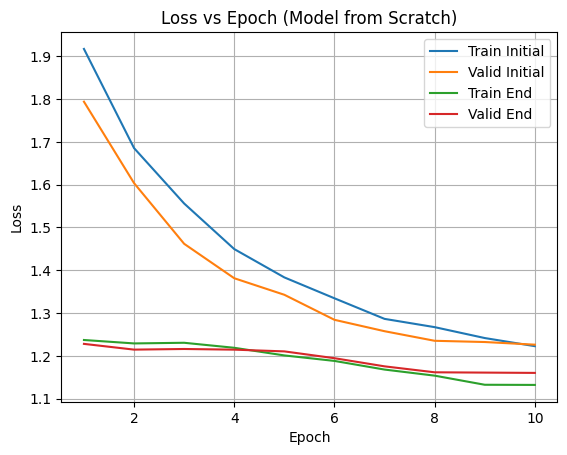

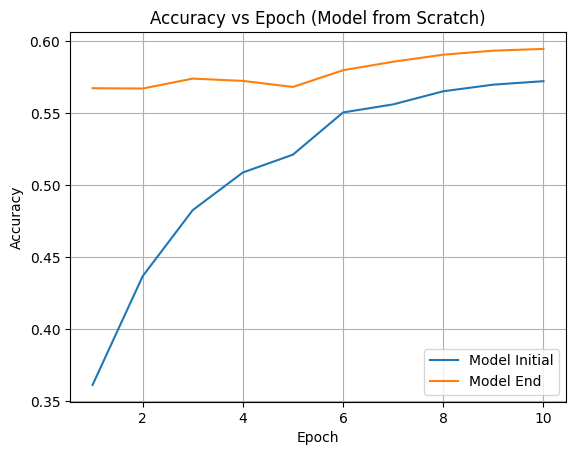

In [ ]:
# Datos Modelo Scratch fit_one_cycle (Inicial)
train_loss_1 = [1.916980, 1.685266, 1.555817, 1.449342, 1.383145, 1.334351, 1.286264, 1.266945, 1.241482, 1.222480]
valid_loss_1 = [1.793701, 1.603455, 1.461677, 1.381204, 1.342566, 1.284080, 1.257460, 1.235063, 1.232191, 1.225997]
accuracy_1 = [0.361200, 0.436700, 0.482600, 0.508700, 0.521100, 0.550400, 0.556000, 0.565100, 0.569700, 0.572100]

# Datos Modelo Scratch fine_tune (Final)
train_loss_2 = [1.236919, 1.228912, 1.230432, 1.218706, 1.200866, 1.188023, 1.167841, 1.153620, 1.132325, 1.131957]
valid_loss_2 = [1.227865, 1.214430, 1.215906, 1.214353, 1.210311, 1.194388, 1.175355, 1.161452, 1.160746, 1.160038]
accuracy_2 = [0.567200, 0.567000, 0.573900, 0.572300, 0.568100, 0.579700, 0.585600, 0.590500, 0.593300, 0.594500]

epochs = range(1, len(train_loss_1) + 1)

plt.plot(epochs, train_loss_1, label='Train Initial')
plt.plot(epochs, valid_loss_1, label='Valid Initial')
plt.plot(epochs, train_loss_2, label='Train End')
plt.plot(epochs, valid_loss_2, label='Valid End')

plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss vs Epoch (Model from Scratch)')
plt.legend()
plt.grid(True)
plt.show()

plt.plot(epochs, accuracy_1, label='Model Initial')
plt.plot(epochs, accuracy_2, label='Model End')

plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Accuracy vs Epoch (Model from Scratch)')
plt.legend()
plt.grid(True)
plt.show()

## Modelo Preentrenado 1 (VGG19)

VGG19 es un modelo de Red Neuronal Convolucional (CNN). Este modelo es una variante de la arquitectura VGG que incluye 19 capas, que se caracteriza por la simplicidad y uniformidad, utilizando convoluciones 3x3 y capas de agrupación máxima (pooling) 2x2 en todas las capas convolucionales.

El modelo comienza con una serie de capas convolucionales seguidas con funciones de activación ReLU, las capas convolucionales tienen filtros de tamaño 3x3 con un paso (stride) de 1 píxel y un relleno (padding) de 1 píxel para mantener el tamaño de la imagen. Después de cada conjunto de capas convolucionales, se aplica una capa de agrupación máxima con un tamaño de filtro de 2x2 y un paso de 2 píxeles, reduciendo la resolución espacial de la salida y ayudando a reducir el número de parámetros en las capas posteriores. Luego de varias capas convolucionales y de agrupación, el modelo termina con capas totalmente conectadas seguidas de capas de salida softmax para la clasificación.

El modelo se entrena utilizando el método fit_one_cycle, que es una técnica de entrenamiento popular en Fastai que ajusta automáticamente la tasa de aprendizaje durante el entrenamiento para mejorar el rendimiento del modelo. Además, se intentó utilizar el método fine_tune para realizar un ajuste fino del modelo en el conjunto de datos específico, pero por falta de RAM de la GPU esto no fue posible.

In [ ]:
model_vgg19 = models.vgg19 #Modelo Preentrenado VGG19

In [ ]:
#Configuración del modelo
learn_vgg19 = vision_learner(
                       dls , #Conjuntos de Entrenamiento y Validación
                       model_vgg19, #Modelo
                       splitter=default_split, #Función predeterminada que divide los parámetros en dos grupos
                       normalize=True,
                       loss_func=CrossEntropyLossFlat(), #Función de pérdida, función de pérdida de entropía cruzada plana (clasificación multiclase)
                       metrics=[accuracy], #Metricas de evaluación del modelo
                       )

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth
100%|██████████| 548M/548M [00:05<00:00, 109MB/s]


SuggestedLRs(valley=0.0010000000474974513)

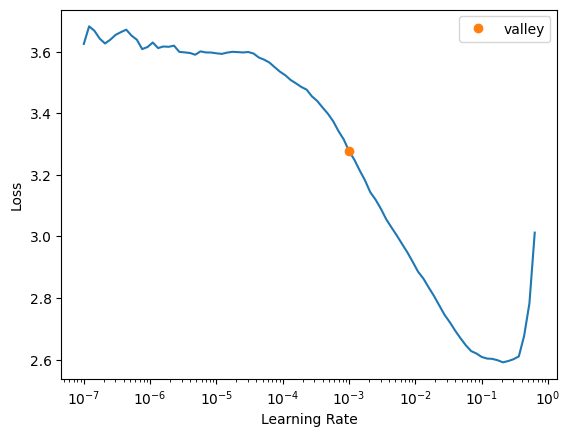

In [ ]:
learn_vgg19.lr_find() #Encontrar tasa de aprendizaje adecuada para el entrenamiento del modelo

In [ ]:
epochs = 10 #Número de épocas
learn_vgg19.fit_one_cycle(epochs, lr_max=1e-3) #Entrenamiento

epoch,train_loss,valid_loss,accuracy,time
0,2.068392,1.228693,0.587700,05:17
1,1.477596,1.000138,0.654100,05:18
2,1.231300,0.923900,0.675600,05:20
3,1.139283,0.894116,0.684500,05:18
4,1.088620,0.885661,0.688200,05:17
5,1.048872,0.867264,0.695700,05:17
6,1.026540,0.853131,0.701600,05:18
7,1.008802,0.844809,0.703100,05:18
8,1.009436,0.841459,0.704100,05:17
9,0.978806,0.840373,0.704000,05:18


In [ ]:
preds_vgg19, targets_vgg19 = learn_vgg19.get_preds()
pred_labels = preds_vgg19.argmax(dim=1) #Predicciones de probabilidades a etiquetas predichas

#Precisión y Recall para cada Clase
precision_per_class = precision_score(targets_vgg19, pred_labels, average=None)
recall_per_class = recall_score(targets_vgg19, pred_labels, average=None)

#Precisión y Recall micro-average
precision_micro = precision_score(targets_vgg19, pred_labels, average='micro')
recall_micro = recall_score(targets_vgg19, pred_labels, average='micro')

#Precisión y Recall macro-average
precision_macro = precision_score(targets_vgg19, pred_labels, average='macro')
recall_macro = recall_score(targets_vgg19, pred_labels, average='macro')

print("Precisión por Clase:", precision_per_class)
print("Recall por Clase:", recall_per_class)
print("Micro-average Precisión:", precision_micro)
print("Micro-average Recall:", recall_micro)
print("Macro-average Precisión:", precision_macro)
print("Macro-average Recall:", recall_macro)

Precisión por Clase: [0.79784946 0.84775465 0.67956469 0.57509158 0.59265734 0.6245098
 0.71482531 0.69842738 0.77895753 0.73185312]
Recall por Clase: [0.742 0.774 0.562 0.471 0.678 0.637 0.757 0.755 0.807 0.857]
Micro-average Precisión: 0.704
Micro-average Recall: 0.704
Macro-average Precisión: 0.7041490865574739
Macro-average Recall: 0.704


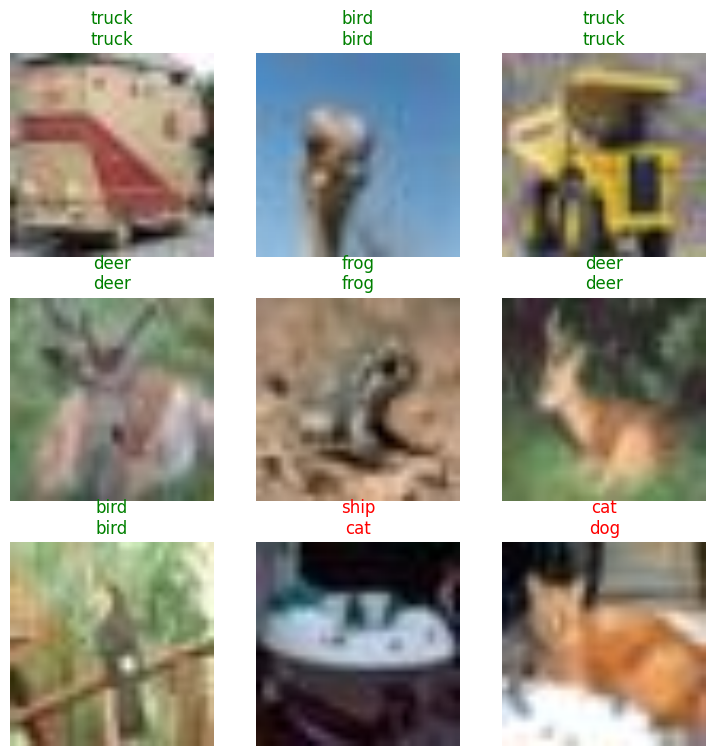

In [ ]:
learn_vgg19.show_results() #Visualización de los resultados

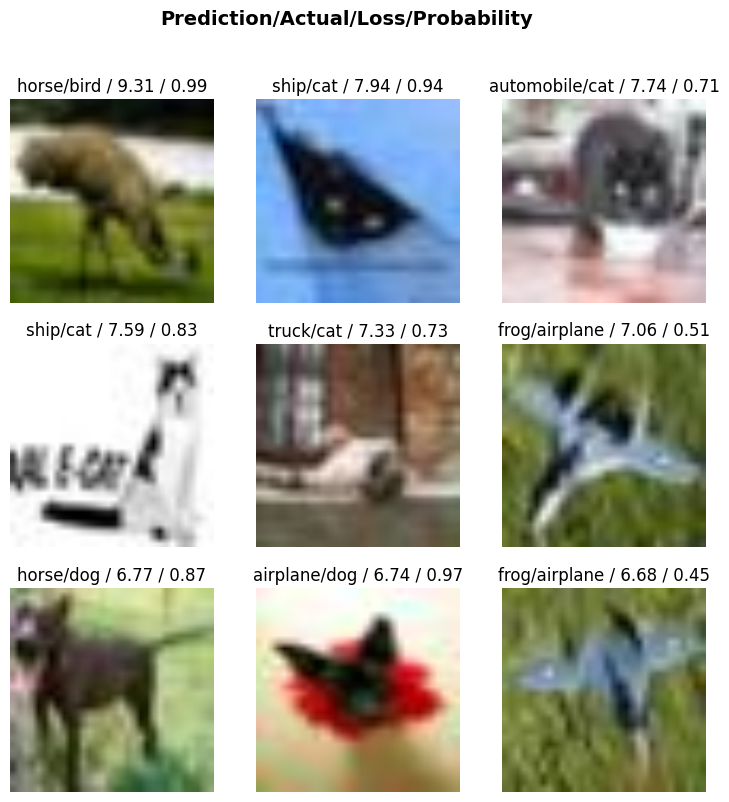

In [ ]:
interp_vgg19 = Interpretation.from_learner(learn_vgg19) #Interpretar y visualizar resultados
interp_vgg19.plot_top_losses(9) #Visualización de las 9 muestras con pérdidas más altas

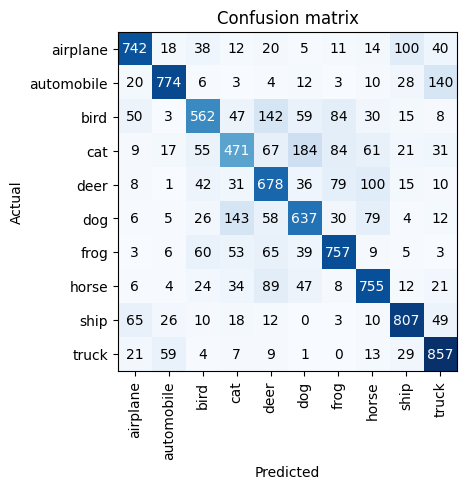

In [ ]:
interp_vgg19 = ClassificationInterpretation.from_learner(learn_vgg19) #Interpretar y visualizar resultados
interp_vgg19.plot_confusion_matrix() #Matriz de confusión

In [ ]:
#Al modelo utilizando VGG-19, se le intento mejorar aplicando learn_vgg19.fine_tune para ajustar los pesos del modelo, pero se descartó la idea por falta de memoria RAM,
      #por lo que se dejó solo con learn_vgg19.fit_one_cycle

"""
OutOfMemoryError: CUDA out of memory. Tried to allocate 784.00 MiB. GPU 0 has a total capacity of 14.75 GiB of which 667.06 MiB is free. Process 2288 has 14.09 GiB memory in use.
Of the allocated memory 13.67 GiB is allocated by PyTorch, and 255.52 MiB is reserved by PyTorch but unallocated.
If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.
See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)
"""

#learn_vgg19.fine_tune(epochs, base_lr=1e-3)

'\nOutOfMemoryError: CUDA out of memory. Tried to allocate 784.00 MiB. GPU 0 has a total capacity of 14.75 GiB of which 667.06 MiB is free. Process 2288 has 14.09 GiB memory in use.\nOf the allocated memory 13.67 GiB is allocated by PyTorch, and 255.52 MiB is reserved by PyTorch but unallocated.\nIf reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.\nSee documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)\n'

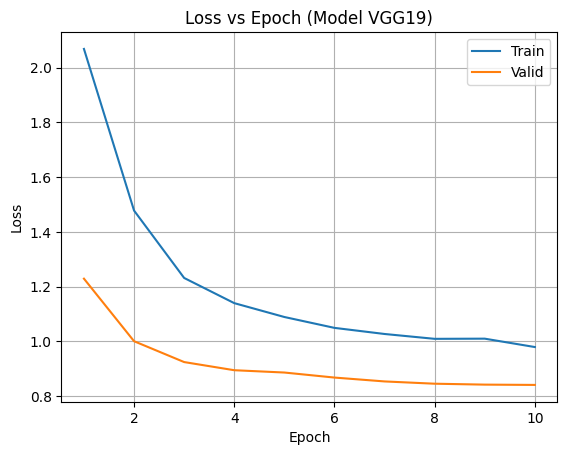

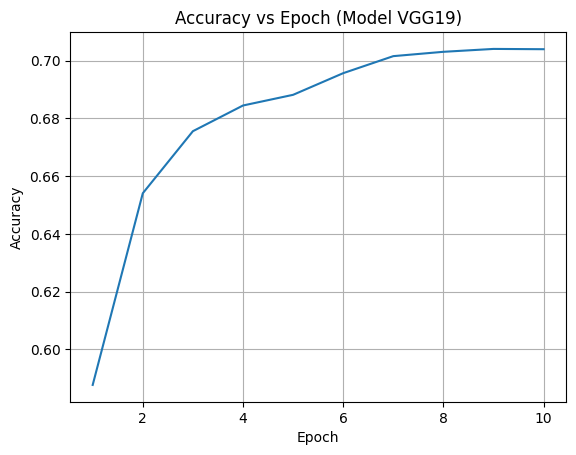

In [ ]:
#Datos Modelo VGG19

train_loss = [2.068392, 1.477596, 1.231300, 1.139283, 1.088620, 1.048872, 1.026540, 1.008802, 1.009436, 0.978806]
valid_loss = [1.228693, 1.000138, 0.923900, 0.894116, 0.885661, 0.867264, 0.853131, 0.844809, 0.841459, 0.840373]
accuracy = [0.587700, 0.654100, 0.675600, 0.684500, 0.688200, 0.695700, 0.701600, 0.703100, 0.704100, 0.704000]

epochs = range(1, len(train_loss) + 1)

plt.plot(epochs, train_loss, label='Train')
plt.plot(epochs, valid_loss, label='Valid')

plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss vs Epoch (Model VGG19)')
plt.legend()
plt.grid(True)
plt.show()

plt.plot(epochs, accuracy)

plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Accuracy vs Epoch (Model VGG19)')
plt.grid(True)
plt.show()

## Modelo Preentrenado 2 (ResNet-18)

ResNet-18 es un modelo de Red Neuronal Convolucional (CNN), es una variante más pequeña de la familia ResNet que consta de 18 capas, incluyendo capas convolucionales y capas de identidad residual.

ResNet-18 utiliza bloques residuales, estos bloques permiten que la red aprenda funciones residuales en lugar de intentar aprender funciones puras, permitiendo que las redes profundas sean más fáciles de optimizar y entrenar, ya que facilita el flujo de gradientes durante el entrenamiento. La arquitectura ResNet-18 comienza con una única capa de convolución seguida de una capa de agrupación máxima para reducir la resolución espacial de la entrada. Luego, sigue una secuencia de bloques residuales, cada uno de los cuales contiene múltiples capas de convolución con funciones de activación ReLU. En lugar de simplemente apilar capas de convolución una tras otra, cada bloque residual tiene una conexión de salto (skip connection) que suma los datos de entrada a la salida del bloque residual, permitiendo que la red aprenda las diferencias entre los datos de entrada y la salida, en lugar de tener que aprender todo desde cero. Después de los bloques residuales, ResNet-18 termina con capas totalmente conectadas seguidas de una capa de salida softmax para la clasificación.

El modelo se entrena utilizando el método fit_one_cycle, que es una técnica de entrenamiento popular en Fastai que ajusta automáticamente la tasa de aprendizaje durante el entrenamiento para mejorar el rendimiento del modelo. Además, se utiliza el método fine_tune para realizar un ajuste fino del modelo en el conjunto de datos específico, lo que puede mejorar aún más su rendimiento.

In [ ]:
model_res18 = resnet18 #Modelo Preentrenado ResNet-18

In [ ]:
#Configuración del modelo
learn_res18 = vision_learner(
                       dls , #Conjuntos de Entrenamiento y Validación
                       model_res18, #Modelo
                       splitter=default_split, #Función predeterminada que divide los parámetros en dos grupos
                       normalize=True,
                       loss_func=CrossEntropyLossFlat(), #Función de pérdida, función de pérdida de entropía cruzada plana (clasificación multiclase)
                       metrics=[accuracy], #Metricas de evaluación del modelo
                       )

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 136MB/s]


SuggestedLRs(valley=0.0012022644514217973)

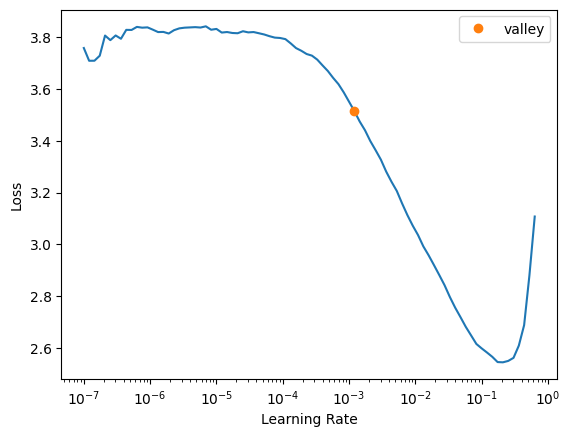

In [ ]:
learn_res18.lr_find() #Encontrar tasa de aprendizaje adecuada para el entrenamiento del modelo

In [ ]:
epochs = 10 #Número de épocas
learn_res18.fit_one_cycle(epochs, lr_max=1e-3) #Entrenamiento

epoch,train_loss,valid_loss,accuracy,time
0,2.091668,1.198977,0.606200,02:19
1,1.163476,0.729393,0.750400,02:29
2,0.759835,0.521341,0.814400,02:14
3,0.607553,0.456487,0.841200,02:16
4,0.526525,0.413398,0.855000,02:16
5,0.478205,0.389794,0.864800,02:16
6,0.455052,0.375460,0.870400,02:14
7,0.431722,0.369189,0.873700,02:16
8,0.419393,0.366436,0.875000,02:14
9,0.408214,0.365783,0.876200,03:14


In [ ]:
preds_res18, targets_res18 = learn_res18.get_preds()
pred_labels_res18 = preds_res18.argmax(dim=1) #Predicciones de probabilidades a etiquetas predichas

#Precisión y Recall para cada Clase
precision_per_class_res18 = precision_score(targets_res18, pred_labels_res18, average=None)
recall_per_class_res18 = recall_score(targets_res18, pred_labels_res18, average=None)

#Precisión y Recall micro-average
precision_micro_res18 = precision_score(targets_res18, pred_labels_res18, average='micro')
recall_micro_res18 = recall_score(targets_res18, pred_labels_res18, average='micro')

#Precisión y Recall macro-average
precision_macro_res18 = precision_score(targets_res18, pred_labels_res18, average='macro')
recall_macro_res18 = recall_score(targets_res18, pred_labels_res18, average='macro')
print("Precisión por Clase:", precision_per_class_res18)
print("Recall por Clase:", recall_per_class_res18)
print("Micro-average Precisión:", precision_micro_res18)
print("Micro-average Recall:", recall_micro_res18)
print("Macro-average Precisión:", precision_macro_res18)
print("Macro-average Recall:", recall_macro_res18)

Precisión por Clase: [0.88899708 0.92996109 0.84842319 0.74701195 0.86053719 0.83991462
 0.90763052 0.87487876 0.92614189 0.9327984 ]
Recall por Clase: [0.913 0.956 0.834 0.75  0.833 0.787 0.904 0.902 0.953 0.93 ]
Micro-average Precisión: 0.8762
Micro-average Recall: 0.8762
Macro-average Precisión: 0.8756294687159338
Macro-average Recall: 0.8762000000000001


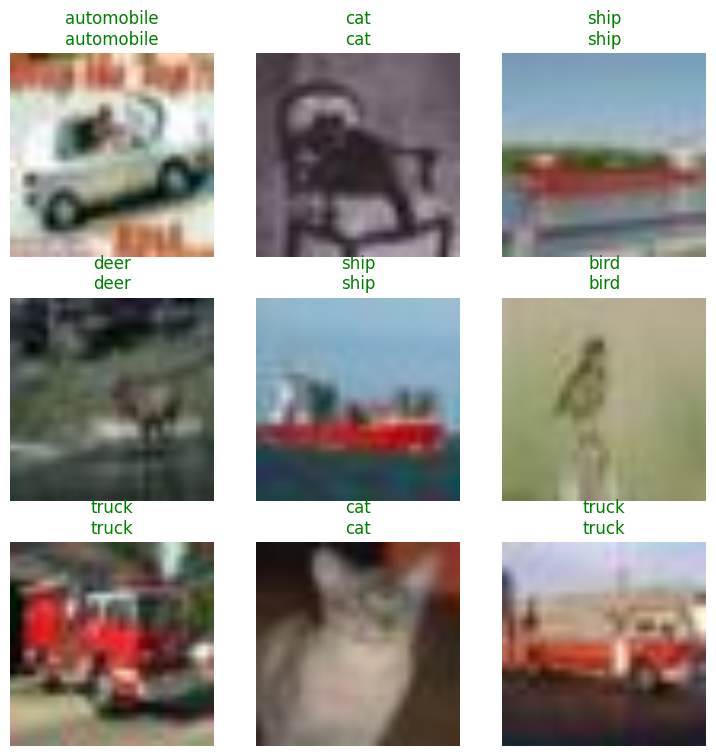

In [ ]:
learn_res18.show_results() #Visualización de los resultados

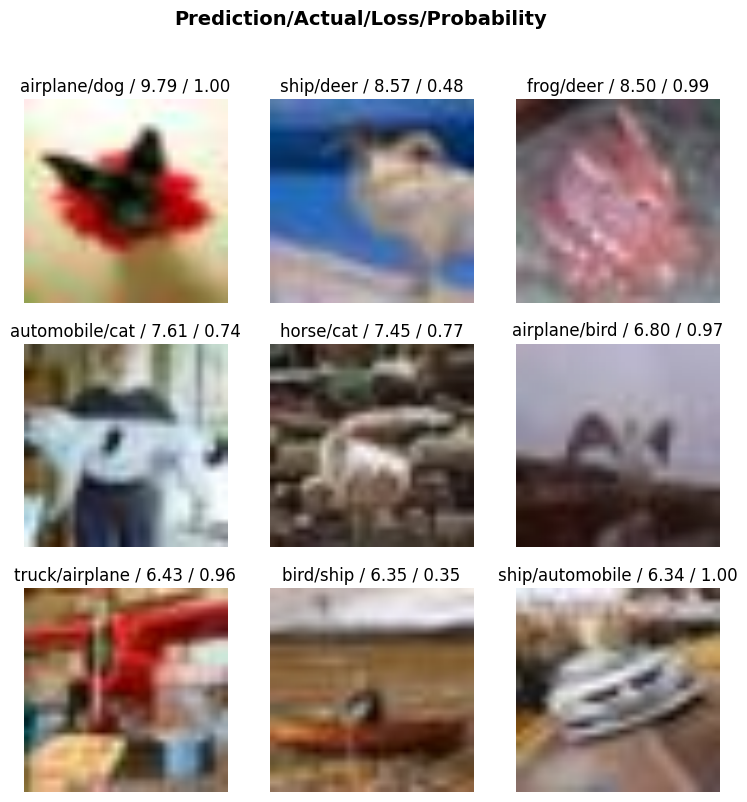

In [ ]:
interp_res18 = Interpretation.from_learner(learn_res18) #Interpretar y visualizar resultados
interp_res18.plot_top_losses(9) #Visualización de las 9 muestras con pérdidas más altas

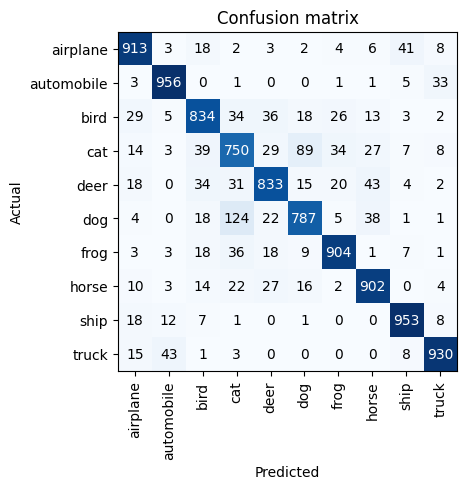

In [ ]:
interp_res18 = ClassificationInterpretation.from_learner(learn_res18) #Interpretar y visualizar resultados
interp_res18.plot_confusion_matrix() #Matriz de confusión

In [ ]:
"""
Luego del entrenamiento inicial con learn_res18.fit_one_cycle donde se estabiliza el entrenamiento
    se aplica learn_res18.fine_tune para ajustar los pesos del modelo,
    en lugar de entrenar todas las capas del modelo desde cero, donde congela las capas base y solo entrena las capas superiores
"""

learn_res18.fine_tune(epochs, base_lr=1e-3)

epoch,train_loss,valid_loss,accuracy,time
0,0.421713,0.380697,0.868900,02:15


epoch,train_loss,valid_loss,accuracy,time
0,0.401666,0.365184,0.876100,02:36
1,0.401115,0.354466,0.879900,02:36
2,0.381808,0.350835,0.879900,02:35
3,0.374613,0.336699,0.882500,02:44
4,0.356182,0.331158,0.884900,02:37
5,0.331778,0.325892,0.888400,02:45
6,0.321492,0.322951,0.888800,02:46
7,0.315746,0.319512,0.889900,02:38
8,0.313249,0.318322,0.889700,02:43
9,0.300181,0.317409,0.890500,02:53


In [ ]:
preds_res18, targets_res18 = learn_res18.get_preds()
pred_labels_res18 = preds_res18.argmax(dim=1) #Predicciones de probabilidades a etiquetas predichas

#Precisión y Recall para cada Clase
precision_per_class_res18 = precision_score(targets_res18, pred_labels_res18, average=None)
recall_per_class_res18 = recall_score(targets_res18, pred_labels_res18, average=None)

#Precisión y Recall micro-average
precision_micro_res18 = precision_score(targets_res18, pred_labels_res18, average='micro')
recall_micro_res18 = recall_score(targets_res18, pred_labels_res18, average='micro')

#Precisión y Recall macro-average
precision_macro_res18 = precision_score(targets_res18, pred_labels_res18, average='macro')
recall_macro_res18 = recall_score(targets_res18, pred_labels_res18, average='macro')
print("Precisión por Clase:", precision_per_class_res18)
print("Recall por Clase:", recall_per_class_res18)
print("Micro-average Precisión:", precision_micro_res18)
print("Micro-average Recall:", recall_micro_res18)
print("Macro-average Precisión:", precision_macro_res18)
print("Macro-average Recall:", recall_macro_res18)

Precisión por Clase: [0.90332031 0.94642857 0.8756371  0.76666667 0.86706349 0.84067086
 0.91351889 0.90167158 0.94510978 0.93960396]
Recall por Clase: [0.925 0.954 0.859 0.759 0.874 0.802 0.919 0.917 0.947 0.949]
Micro-average Precisión: 0.8905
Micro-average Recall: 0.8905
Macro-average Precisión: 0.8899691217795012
Macro-average Recall: 0.8905000000000001


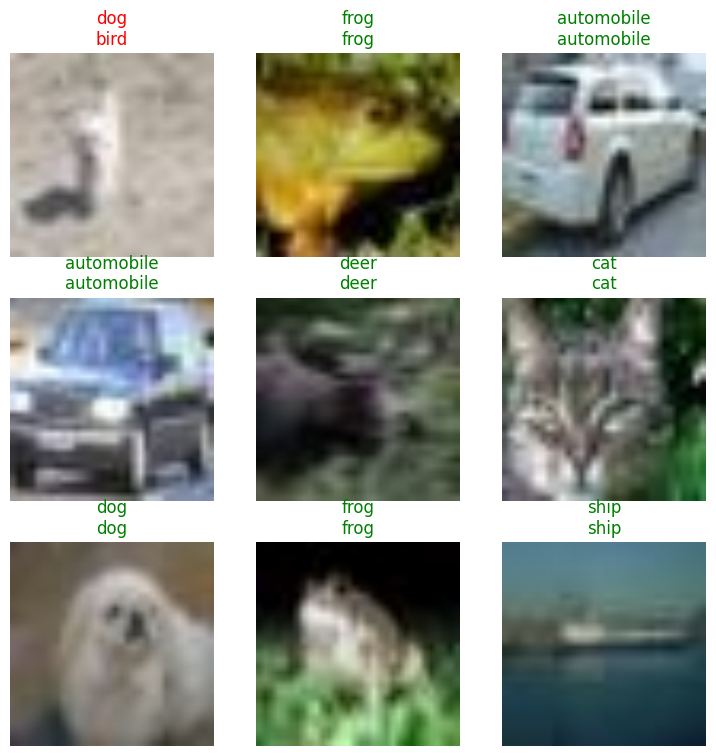

In [ ]:
learn_res18.show_results() #Visualización de los resultados

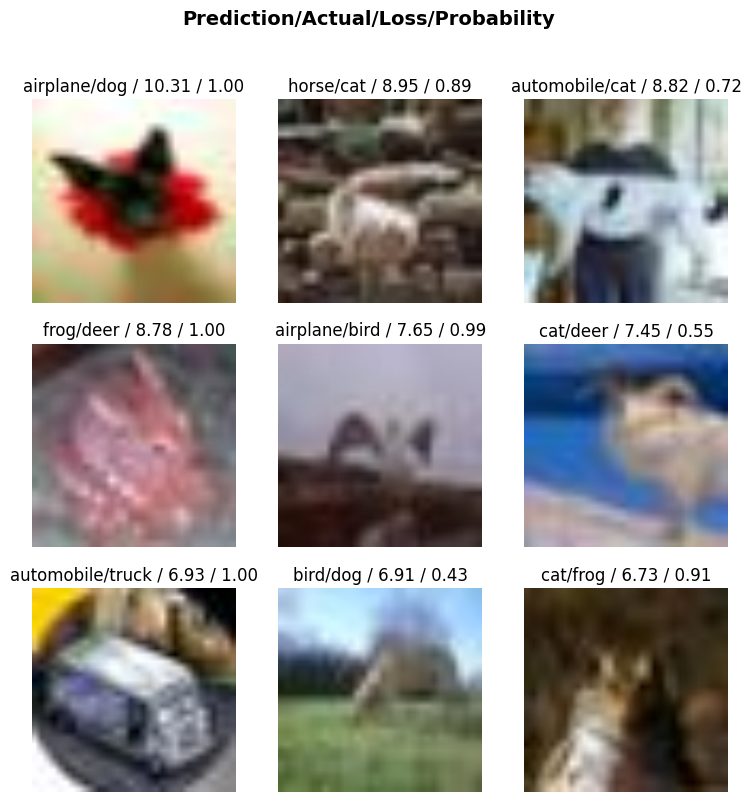

In [ ]:
interp_res18 = Interpretation.from_learner(learn_res18) #Interpretar y visualizar resultados
interp_res18.plot_top_losses(9) #Visualización de las 9 muestras con pérdidas más altas

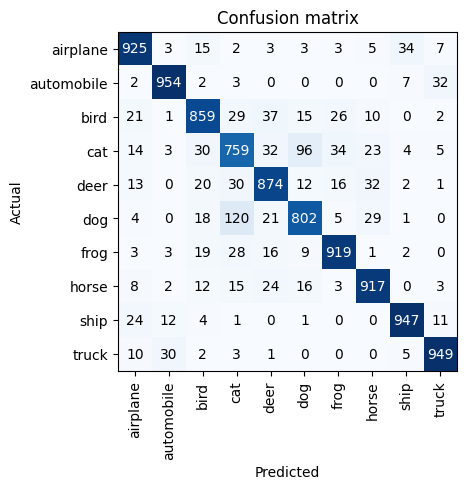

In [ ]:
interp_res18 = ClassificationInterpretation.from_learner(learn_res18) #Interpretar y visualizar resultados
interp_res18.plot_confusion_matrix() #Matriz de confusión

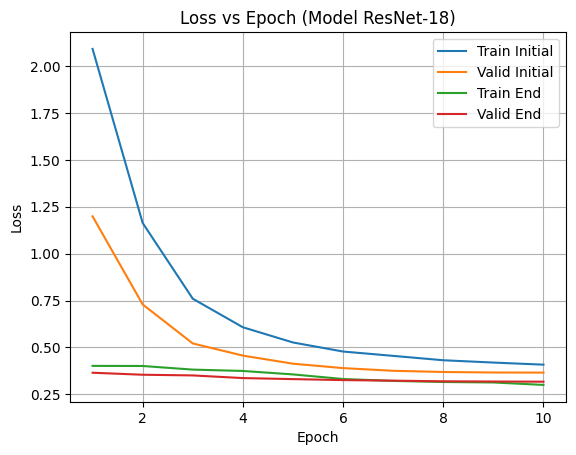

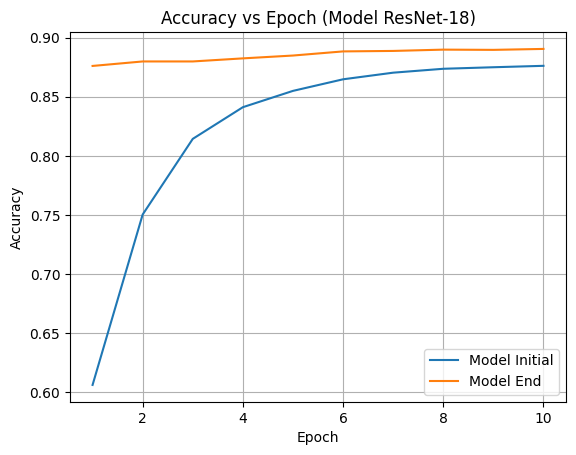

In [ ]:
# Datos Modelo ResNet-18 fit_one_cycle (Inicial)
train_loss_1_res18 = [2.091668, 1.163476, 0.759835, 0.607553, 0.526525, 0.478205, 0.455052, 0.431722, 0.419393, 0.408214]
valid_loss_1_res18 = [1.198977, 0.729393, 0.521341, 0.456487, 0.413398, 0.389794, 0.375460, 0.369189, 0.366436, 0.365783]
accuracy_1_res18 = [0.606200, 0.750400, 0.814400, 0.841200, 0.855000, 0.864800, 0.870400, 0.873700, 0.875000, 0.876200]

# Datos Modelo ResNet-18 fine_tune (Final)
train_loss_2_res18 = [0.401666, 0.401115, 0.381808, 0.374613, 0.356182, 0.331778, 0.321492, 0.315746, 0.313249, 0.300181]
valid_loss_2_res18 = [0.365184, 0.354466, 0.350835, 0.336699, 0.331158, 0.325892, 0.322951, 0.319512, 0.318322, 0.317409]
accuracy_2_res18 = [0.876100, 0.879900, 0.879900, 0.882500, 0.884900, 0.888400, 0.888800, 0.889900, 0.889700, 0.890500]

epochs = range(1, len(train_loss_1_res18) + 1)

plt.plot(epochs, train_loss_1_res18, label='Train Initial')
plt.plot(epochs, valid_loss_1_res18, label='Valid Initial')
plt.plot(epochs, train_loss_2_res18, label='Train End')
plt.plot(epochs, valid_loss_2_res18, label='Valid End')

plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss vs Epoch (Model ResNet-18)')
plt.legend()
plt.grid(True)
plt.show()

plt.plot(epochs, accuracy_1_res18, label='Model Initial')
plt.plot(epochs, accuracy_2_res18, label='Model End')

plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Accuracy vs Epoch (Model ResNet-18)')
plt.legend()
plt.grid(True)
plt.show()

## Modelo Preentrenado 3 (ResNet-34)

ResNet-34 es un modelo de Red Neuronal Convolucional (CNN) más profundo de la familia ResNet, que consta con 34 capas en total, incluyendo capas convolucionales y capas de identidad residual.

Utiliza bloques residuales para permitir que la red aprenda funciones residuales en lugar de intentar aprender funciones puras. Esto hace que el entrenamiento de redes profundas sea más eficiente al facilitar el flujo de gradientes durante el entrenamiento. Comienza con una capa de convolución inicial seguida de una capa de agrupación máxima para reducir la resolución espacial de la entrada. Luego, sigue una secuencia de bloques residuales, cada uno de los cuales contiene múltiples capas de convolución con funciones de activación ReLU, cada bloque residual tiene una conexión de salto (skip connection) que suma los datos de entrada a la salida del bloque residual, permitiendo que la red aprenda las diferencias entre los datos de entrada y la salida, facilita el entrenamiento de la red y ayudando a prevenir el problema de desvanecimiento de gradientes en redes profundas. Finalmente, luego de los bloques residuales, termina con capas totalmente conectadas seguidas de una capa de salida softmax para la clasificación.

El modelo se entrena utilizando el método fit_one_cycle, que es una técnica de entrenamiento popular en Fastai que ajusta automáticamente la tasa de aprendizaje durante el entrenamiento para mejorar el rendimiento del modelo. Además, se utiliza el método fine_tune para realizar un ajuste fino del modelo en el conjunto de datos específico, lo que puede mejorar aún más su rendimiento.

In [ ]:
model_res34 = resnet34 #Modelo Preentrenado ResNet-34

In [ ]:
#Configuración del modelo
learn_res34 = vision_learner(
                       dls , #Conjuntos de Entrenamiento y Validación
                       model_res34, #Modelo
                       splitter=default_split, #Función predeterminada que divide los parámetros en dos grupos
                       normalize=True,
                       loss_func=CrossEntropyLossFlat(), #Función de pérdida, función de pérdida de entropía cruzada plana (clasificación multiclase)
                       metrics=[accuracy], #Metricas de evaluación del modelo
                       )

Downloading: "https://download.pytorch.org/models/resnet34-b627a593.pth" to /root/.cache/torch/hub/checkpoints/resnet34-b627a593.pth
100%|██████████| 83.3M/83.3M [00:00<00:00, 172MB/s]


SuggestedLRs(valley=0.0020892962347716093)

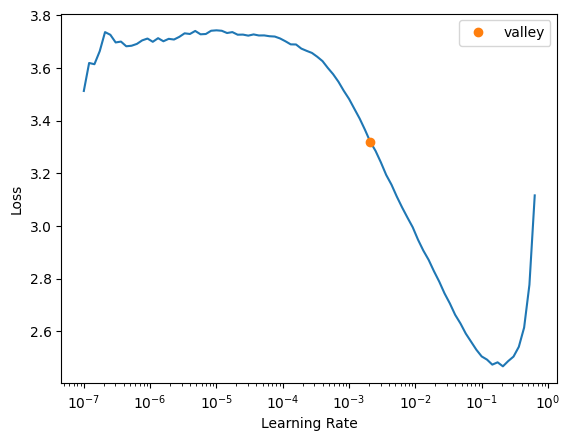

In [ ]:
learn_res34.lr_find() #Encontrar tasa de aprendizaje adecuada para el entrenamiento del modelo

In [ ]:
epochs = 10 #Número de época
learn_res34.fit_one_cycle(epochs, lr_max=1e-3) #Entrenamiento

epoch,train_loss,valid_loss,accuracy,time
0,2.052776,1.079432,0.638400,03:05
1,1.001492,0.573635,0.808300,03:00
2,0.610398,0.398834,0.861600,03:06
3,0.469627,0.340540,0.877100,03:07
4,0.408782,0.323432,0.889200,03:05
5,0.380284,0.301634,0.894800,03:04
6,0.341065,0.287430,0.900200,03:07
7,0.326077,0.281166,0.901400,03:06
8,0.312013,0.281658,0.902400,03:06
9,0.308801,0.283568,0.900900,03:02


In [ ]:
preds_res34, targets_res34 = learn_res34.get_preds()
pred_labels_res34 = preds_res34.argmax(dim=1) #Predicciones de probabilidades a etiquetas predichas

#Precisión y Recall para cada Clase
precision_per_class_res34 = precision_score(targets_res34, pred_labels_res34, average=None)
recall_per_class_res34 = recall_score(targets_res34, pred_labels_res34, average=None)

#Precisión y Recall micro-average
precision_micro_res34 = precision_score(targets_res34, pred_labels_res34, average='micro')
recall_micro_res34 = recall_score(targets_res34, pred_labels_res34, average='micro')

#Precisión y Recall macro-average
precision_macro_res34 = precision_score(targets_res34, pred_labels_res34, average='macro')
recall_macro_res34 = recall_score(targets_res34, pred_labels_res34, average='macro')
print("Precisión por Clase:", precision_per_class_res34)
print("Recall por Clase:", recall_per_class_res34)
print("Micro-average Precisión:", precision_micro_res34)
print("Micro-average Recall:", recall_micro_res34)
print("Macro-average Precisión:", precision_macro_res34)
print("Macro-average Recall:", recall_macro_res34)

Precisión por Clase: [0.92164545 0.953      0.9002079  0.79879276 0.88694758 0.83683684
 0.94530444 0.88409962 0.94129159 0.93996063]
Recall por Clase: [0.941 0.953 0.866 0.794 0.863 0.836 0.916 0.923 0.962 0.955]
Micro-average Precisión: 0.9009
Micro-average Recall: 0.9009
Macro-average Precisión: 0.900808679348601
Macro-average Recall: 0.9009


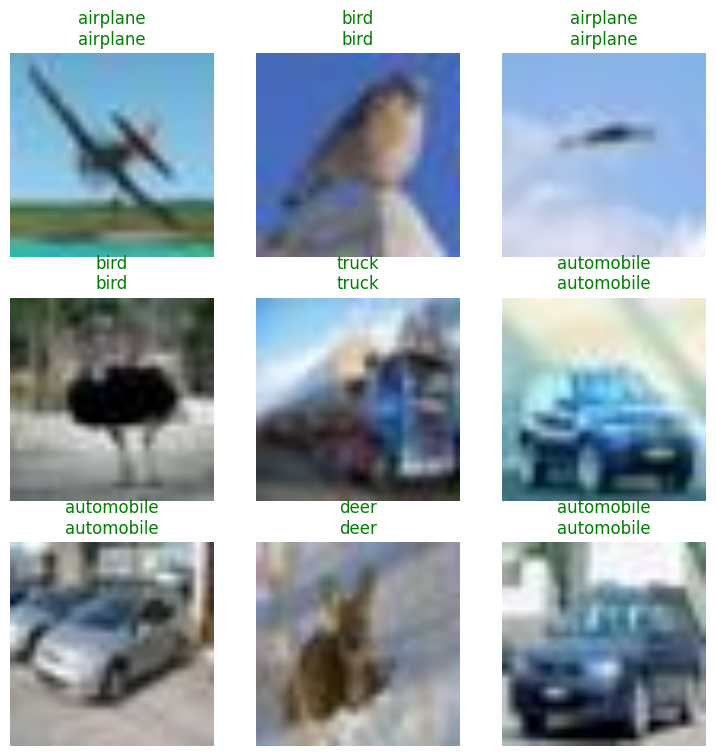

In [ ]:
learn_res34.show_results() #Visualización de los resultados

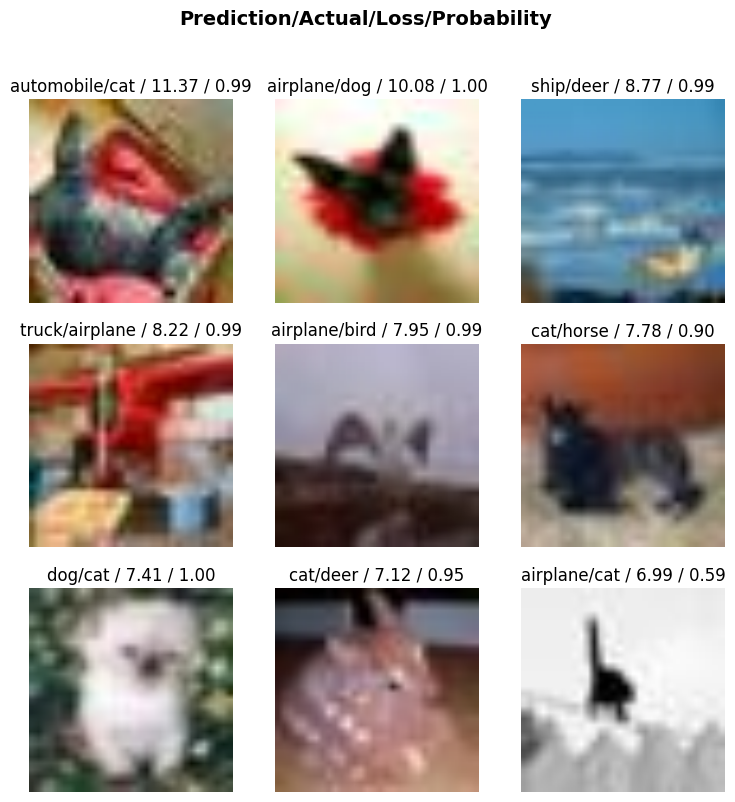

In [ ]:
interp_res34 = Interpretation.from_learner(learn_res34) #Interpretar y visualizar resultados
interp_res34.plot_top_losses(9) #Visualización de las 9 muestras con pérdidas más altas

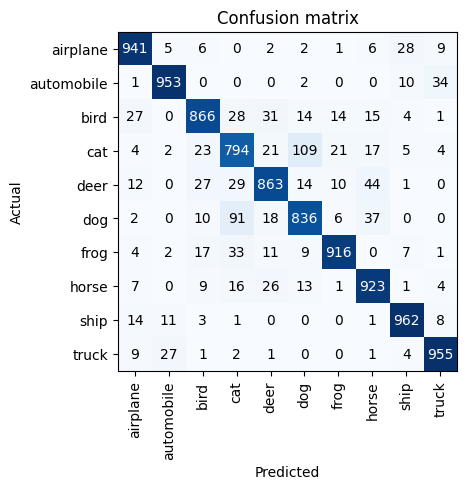

In [ ]:
interp_res34 = ClassificationInterpretation.from_learner(learn_res34) #Interpretar y visualizar resultados
interp_res34.plot_confusion_matrix() #Matriz de confusión

In [ ]:
"""
Luego del entrenamiento inicial con learn_res34.fit_one_cycle donde se estabiliza el entrenamiento
    se aplica learn_res34.fine_tune para ajustar los pesos del modelo,
    en lugar de entrenar todas las capas del modelo desde cero, donde congela las capas base y solo entrena las capas superiores
"""

learn_res34.fine_tune(epochs, base_lr=1e-3)

epoch,train_loss,valid_loss,accuracy,time
0,0.320293,0.288866,0.899800,03:05


epoch,train_loss,valid_loss,accuracy,time
0,0.305243,0.276847,0.902100,04:00
1,0.298561,0.274323,0.902800,04:00
2,0.283613,0.264334,0.905700,04:00
3,0.270633,0.261684,0.910600,04:01
4,0.250510,0.252070,0.911500,03:59
5,0.235911,0.245087,0.914800,04:00
6,0.226980,0.245686,0.914600,03:59
7,0.209163,0.243301,0.916000,03:59
8,0.205215,0.241924,0.916600,04:00
9,0.202621,0.241222,0.916500,03:59


In [ ]:
preds_res34, targets_res34 = learn_res34.get_preds()
pred_labels_res34 = preds_res34.argmax(dim=1) #Predicciones de probabilidades a etiquetas predichas

#Precisión y Recall para cada Clase
precision_per_class_res34 = precision_score(targets_res34, pred_labels_res34, average=None)
recall_per_class_res34 = recall_score(targets_res34, pred_labels_res34, average=None)

#Precisión y Recall micro-average
precision_micro_res34 = precision_score(targets_res34, pred_labels_res34, average='micro')
recall_micro_res34 = recall_score(targets_res34, pred_labels_res34, average='micro')

#Precisión y Recall macro-average
precision_macro_res34 = precision_score(targets_res34, pred_labels_res34, average='macro')
recall_macro_res34 = recall_score(targets_res34, pred_labels_res34, average='macro')
print("Precisión por Clase:", precision_per_class_res34)
print("Recall por Clase:", recall_per_class_res34)
print("Micro-average Precisión:", precision_micro_res34)
print("Micro-average Recall:", recall_micro_res34)
print("Macro-average Precisión:", precision_macro_res34)
print("Macro-average Recall:", recall_macro_res34)

Precisión por Clase: [0.93538767 0.95436508 0.91419816 0.82128514 0.91113381 0.86728395
 0.9488978  0.90618956 0.94634146 0.95712861]
Recall por Clase: [0.941 0.962 0.895 0.818 0.892 0.843 0.947 0.937 0.97  0.96 ]
Micro-average Precisión: 0.9165
Micro-average Recall: 0.9165
Macro-average Precisión: 0.9162211244189331
Macro-average Recall: 0.9164999999999999


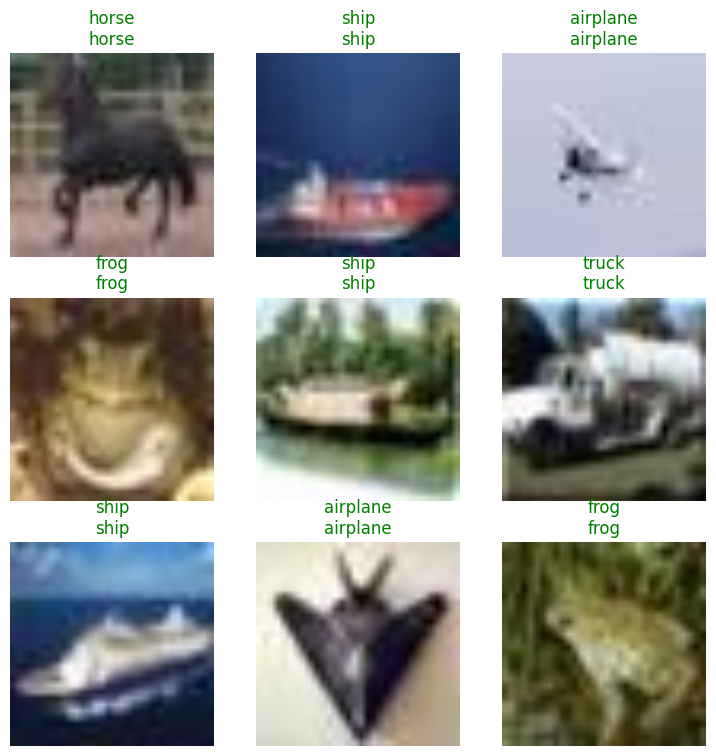

In [ ]:
learn_res34.show_results() #Visualización de los resultados

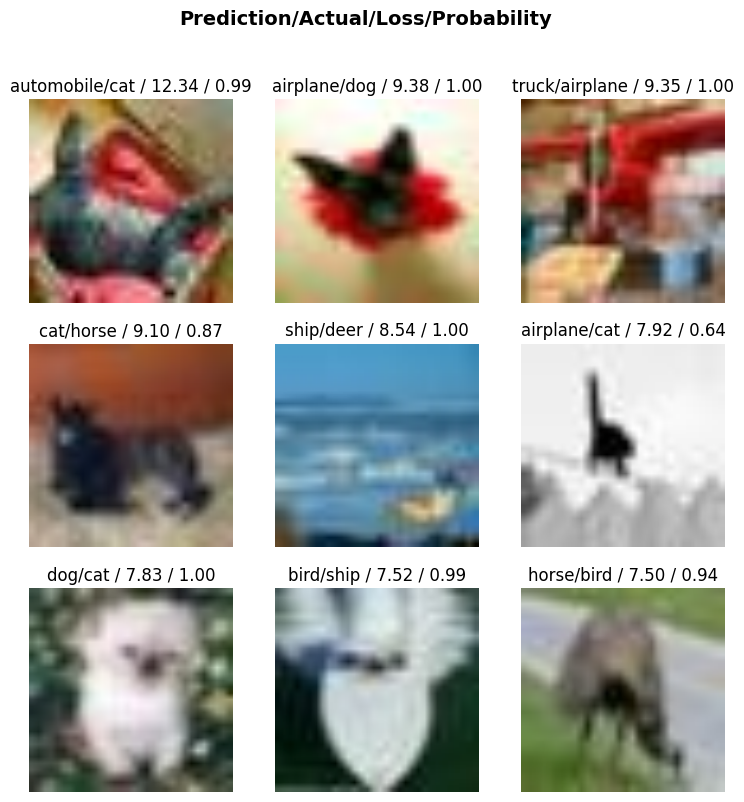

In [ ]:
interp_res34 = Interpretation.from_learner(learn_res34) #Interpretar y visualizar resultados
interp_res34.plot_top_losses(9) #Visualización de las 9 muestras con pérdidas más altas

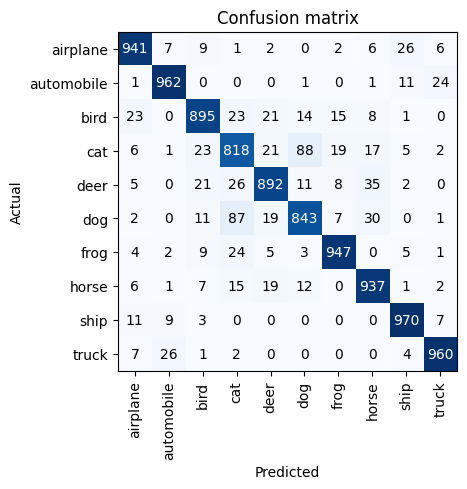

In [ ]:
interp_res34 = ClassificationInterpretation.from_learner(learn_res34) #Interpretar y visualizar resultados
interp_res34.plot_confusion_matrix() #Matriz de confusión

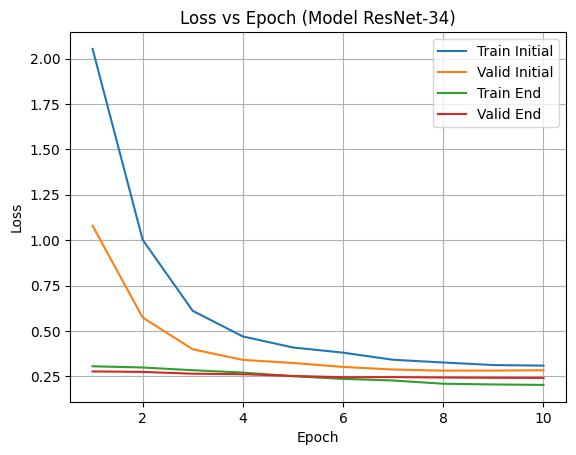

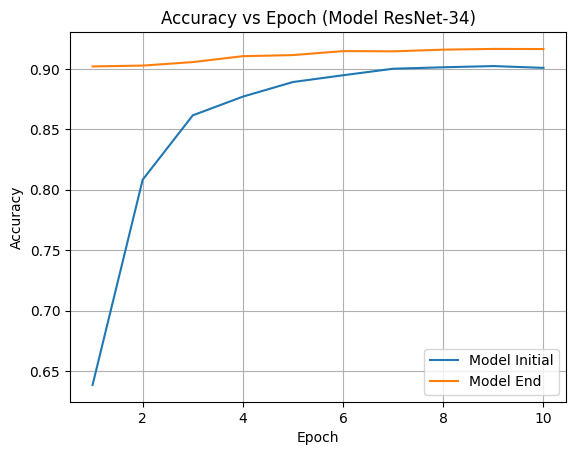

In [ ]:
#Datos Modelo ResNet-34 fit_one_cycle (Inicial)
train_loss_1_res34 = [2.052776, 1.001492, 0.610398, 0.469627, 0.408782, 0.380284, 0.341065, 0.326077, 0.312013, 0.308801]
valid_loss_1_res34 = [1.079432, 0.573635, 0.398834, 0.340540, 0.323432, 0.301634, 0.287430, 0.281166, 0.281658, 0.283568]
accuracy_1_res34 = [0.638400, 0.808300, 0.861600, 0.877100, 0.889200, 0.894800, 0.900200, 0.901400, 0.902400, 0.900900]

#Datos Modelo ResNet-34 fine_tune (Final)
train_loss_2_res34 = [0.305243, 0.298561, 0.283613, 0.270633, 0.250510, 0.235911, 0.226980, 0.209163, 0.205215, 0.202621]
valid_loss_2_res34 = [0.276847, 0.274323, 0.264334, 0.261684, 0.252070, 0.245087, 0.245686, 0.243301, 0.241924, 0.241222]
accuracy_2_res34 = [0.902100, 0.902800, 0.905700, 0.910600, 0.911500, 0.914800, 0.914600, 0.916000, 0.916600, 0.916500]

epochs = range(1, len(train_loss_1_res34) + 1)

plt.plot(epochs, train_loss_1_res34, label='Train Initial')
plt.plot(epochs, valid_loss_1_res34, label='Valid Initial')
plt.plot(epochs, train_loss_2_res34, label='Train End')
plt.plot(epochs, valid_loss_2_res34, label='Valid End')

plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss vs Epoch (Model ResNet-34)')
plt.legend()
plt.grid(True)
plt.show()

plt.plot(epochs, accuracy_1_res34, label='Model Initial')
plt.plot(epochs, accuracy_2_res34, label='Model End')

plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Accuracy vs Epoch (Model ResNet-34)')
plt.legend()
plt.grid(True)
plt.show()

## Elección Mejor Modelo

Para la elección del mejor modelo, se comparan algunas métricas como el loss y accuracy en el conjunto de validación, los tiempo de entrenamiento, la precisión y el recall de cada una de las clases, las matrices de confusión, todo esto, para los modelos finales del modelo desde cero y los tres modelos preentrenados.

In [ ]:
precision = {'Modelo': ['Cero', 'VGG19', 'Resnet18', 'Resnet34'],
    'airplane': [0.64646465, 0.79784946, 0.90332031, 0.93538767],
    'automobile': [0.6634016, 0.84775465, 0.94642857, 0.95436508],
    'bird': [0.4895719, 0.67956469, 0.8756371, 0.91419816],
    'cat': [0.46223224, 0.57509158, 0.76666667, 0.82128514],
    'deer': [0.53250774, 0.59265734, 0.86706349, 0.91113381],
    'dog': [0.54252874, 0.6245098, 0.84067086, 0.86728395],
    'frog': [0.61842105, 0.71482531, 0.91351889, 0.9488978],
    'horse': [0.59855986, 0.69842738, 0.90167158, 0.90618956],
    'ship': [0.70104068, 0.77895753, 0.94510978, 0.94634146],
    'truck': [0.64047151, 0.73185312, 0.93960396, 0.95712861]}

print("Precision por Clase (Modelos finales)")
precision_df = pd.DataFrame(precision)
precision_df

Precision por Clase (Modelos finales)


,Modelo,airplane,automobile,bird,cat,deer,dog,frog,horse,ship,truck
0,Cero,0.646465,0.663402,0.489572,0.462232,0.532508,0.542529,0.618421,0.598560,0.701041,0.640472
1,VGG19,0.797849,0.847755,0.679565,0.575092,0.592657,0.624510,0.714825,0.698427,0.778958,0.731853
2,Resnet18,0.903320,0.946429,0.875637,0.766667,0.867063,0.840671,0.913519,0.901672,0.945110,0.939604
3,Resnet34,0.935388,0.954365,0.914198,0.821285,0.911134,0.867284,0.948898,0.906190,0.946341,0.957129


In [ ]:
recall = { 'Modelo': ['Cero', 'VGG19', 'Resnet18', 'Resnet34'],
    'airplane': [0.64, 0.742, 0.925, 0.941],
    'automobile': [0.745, 0.774, 0.954, 0.962],
    'bird': [0.446, 0.562, 0.859, 0.895],
    'cat': [0.41, 0.471, 0.759, 0.818],
    'deer': [0.516, 0.678, 0.874, 0.892],
    'dog': [0.472, 0.637, 0.802, 0.843],
    'frog': [0.658, 0.757, 0.919, 0.947],
    'horse': [0.665, 0.755, 0.917, 0.937],
    'ship': [0.741, 0.807, 0.947, 0.97],
    'truck': [0.652, 0.857, 0.949, 0.96]}

print("Recall por Clase (Modelos finales)")
recall_df = pd.DataFrame(recall)
recall_df

Recall por Clase (Modelos finales)


,Modelo,airplane,automobile,bird,cat,deer,dog,frog,horse,ship,truck
0,Cero,0.640,0.745,0.446,0.410,0.516,0.472,0.658,0.665,0.741,0.652
1,VGG19,0.742,0.774,0.562,0.471,0.678,0.637,0.757,0.755,0.807,0.857
2,Resnet18,0.925,0.954,0.859,0.759,0.874,0.802,0.919,0.917,0.947,0.949
3,Resnet34,0.941,0.962,0.895,0.818,0.892,0.843,0.947,0.937,0.970,0.960


In [ ]:
data = { 'Modelo': ['Cero', 'VGG19', 'Resnet18', 'Resnet34'],
    'Accuracy': [0.594500, 0.704000, 0.890500, 0.916500],
    'Valid_Loss': [1.160038, 0.840373, 0.317409, 0.241222],
    'Time': ['44m 58s', '52m 28s', '52m 56s', '1h 13m 50s'] }

print("Metricas de Modelos finales")
data_df = pd.DataFrame(data)
data_df

Metricas de Modelos finales


,Modelo,Accuracy,Valid_Loss,Time
0,Cero,0.5945,1.160038,44m 58s
1,VGG19,0.7040,0.840373,52m 28s
2,Resnet18,0.8905,0.317409,52m 56s
3,Resnet34,0.9165,0.241222,1h 13m 50s


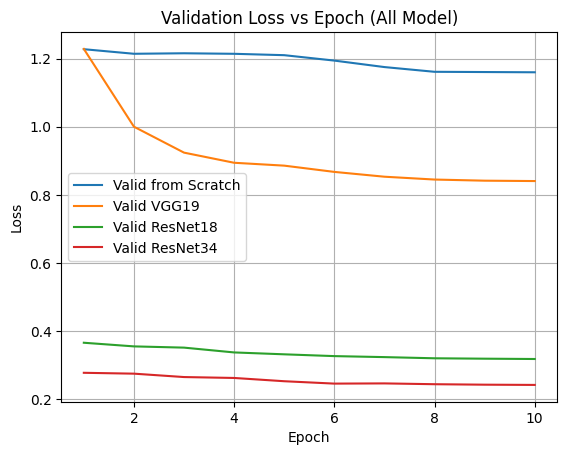

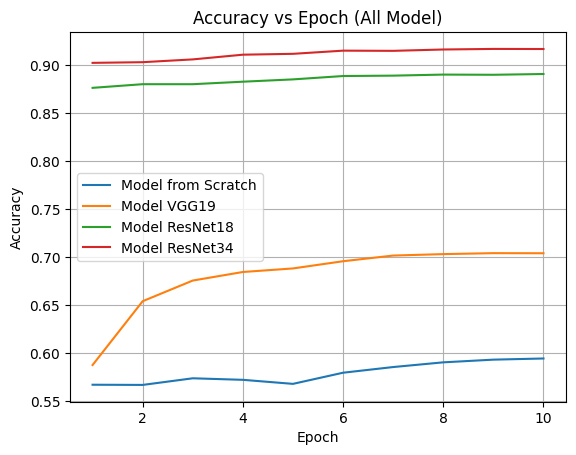

In [ ]:
#Comparación del Loss Validation de todos los modelos
plt.plot(epochs, valid_loss_2, label='Valid from Scratch')
plt.plot(epochs, valid_loss, label='Valid VGG19')
plt.plot(epochs, valid_loss_2_res18, label='Valid ResNet18')
plt.plot(epochs, valid_loss_2_res34, label='Valid ResNet34')

plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Validation Loss vs Epoch (All Model)')
plt.legend()
plt.grid(True)
plt.show()

#Comparación de la Accuracy de todos los modelos
plt.plot(epochs, accuracy_2, label='Model from Scratch')
plt.plot(epochs, accuracy, label='Model VGG19')
plt.plot(epochs, accuracy_2_res18, label='Model ResNet18')
plt.plot(epochs, accuracy_2_res34, label='Model ResNet34')

plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Accuracy vs Epoch (All Model)')
plt.legend()
plt.grid(True)
plt.show()

A partir de las métricas anteriormente presentadas entre los cuatro modelos (Modelo Cero, VGG19, Resnet18 y Resnet34) para elejir el mejor. El modelo ResNet-34 presenta la mayor accuracy (0.9165) y el menor valid loss (0.241222) en los datos de validación, además, también presenta el mayor tiempo de entrenamiento (1h 13m 50s). En términos de precisión y recall por clase, esté modelo también muestra un rendimiento generalmente sólido en comparación con los otros modelos, con valores altos en la mayoría de las clases. Por ello, el modelo ResNet-34 parece ser el mejor modelo entre los entrenados debido a su alto accuracy, bajo valid loss y un rendimiento consistente en precisión y recall por clase.

## Agrupación Datos de Validación a Entrenamiento para Modelo Final (45k)

Una vez seleccionado el mejor modelo (ResNet-34), se vuelve a entrenar el modelo, pero ahora con 45.000 imágenes de entrenamiento y 5.000 de validación, esto para que el modelo sea más robusto, para luego evaluar el conjunto de prueba.

In [ ]:
#Rutas originales y finales
path_train_original = '/content/train/'
path_validation_original = '/content/validation/'
path_train_new = '/content/train_2/'
path_validation_new = '/content/validation_2/'

#Crear directorios nuevos
os.makedirs(path_train_new, exist_ok=True)
os.makedirs(path_validation_new, exist_ok=True)

if os.path.exists(path_train_new):
    shutil.rmtree(path_train_new)

shutil.copytree(path_train_original, path_train_new) #Copia de train

# Copiar 'validation' a 'validation_2' y modificar los nombres de los archivos (para evitar sobreescribir archivos)
for root, dirs, files in os.walk(path_validation_original):
    for file in files:
        source_file = os.path.join(root, file)
        dest_file = os.path.join(path_validation_new, os.path.relpath(root, path_validation_original), file)
        os.makedirs(os.path.dirname(dest_file), exist_ok=True)
        shutil.copyfile(source_file, dest_file)
        new_file_name = os.path.splitext(file)[0] + "_v" + os.path.splitext(file)[1] #Modificar el nombre del archivo en validation_2 agregando "_v"
        os.rename(dest_file, os.path.join(os.path.dirname(dest_file), new_file_name))

#Lista de archivos en validation_2
validation_2_files = []
for root, dirs, files in os.walk(path_validation_new):
    for file in files:
        validation_2_files.append(os.path.join(root, file))

selected_validation_2_files = random.sample(validation_2_files, 5000) #Seleccionar random 5000 imágenes de validation_2

#Mover las imágenes de validation_2 a train_2
for file in selected_validation_2_files:
    folder_name = os.path.basename(os.path.dirname(file))
    dest_dir = os.path.join(path_train_new, folder_name)
    os.makedirs(dest_dir, exist_ok=True)
    shutil.move(file, dest_dir)

#Contar número de imágenes en los directorios para rectificar
num_files_train = sum(len(files) for _, _, files in os.walk(path_train_original))
num_files_train_2 = sum(len(files) for _, _, files in os.walk(path_train_new))
num_files_validation = sum(len(files) for _, _, files in os.walk(path_validation_original))
num_files_validation_2 = sum(len(files) for _, _, files in os.walk(path_validation_new))

print(f"Número de imágenes en 'train': {num_files_train}")
print(f"Número de imágenes en 'train_2': {num_files_train_2}")
print(f"Número de imágenes en 'validation': {num_files_validation}")
print(f"Número de imágenes en 'validation_2': {num_files_validation_2}")

Número de imágenes en 'train': 40000
Número de imágenes en 'train_2': 45000
Número de imágenes en 'validation': 10000
Número de imágenes en 'validation_2': 5000


In [ ]:
img_size = 224 #Redimensionamiento de las imágenes
batch_size = 256 #Tamaño del lote

In [ ]:
#Definición del DataBlock
dblock = DataBlock(blocks=(ImageBlock, CategoryBlock), #Tipos de datos que contendrá DataBlock; imágenes (datos de entrada), etiquetas (categoría)
                   get_items=get_image_files, #Archivos
                   splitter=GrandparentSplitter(train_name='train_2', #División de los datos, y nombre de las carpetas
                                                valid_name='validation_2' ),
                   get_y=parent_label, #Nombre de las etiquetas a partir de los nombres de las carpetas
                   item_tfms=[Resize(img_size)], #Transformación
                   batch_tfms=aug_transforms()                  ) #Tranformación

In [ ]:
#Creación del DataLoaders
dls = dblock.dataloaders(path,
                         bs=batch_size,  #Tamaño del lote
                         verbose=True,
                         device=torch.device('cuda') )  #Utilizar la GPU para mejora del rendimiento

Found 107608 items
2 datasets of sizes 45000,5000
Setting up Pipeline: PILBase.create
Setting up Pipeline: parent_label -> Categorize -- {'vocab': None, 'sort': True, 'add_na': False}
Setting up after_item: Pipeline: Resize -- {'size': (224, 224), 'method': 'crop', 'pad_mode': 'reflection', 'resamples': (<Resampling.BILINEAR: 2>, <Resampling.NEAREST: 0>), 'p': 1.0} -> ToTensor
Setting up before_batch: Pipeline: 
Setting up after_batch: Pipeline: IntToFloatTensor -- {'div': 255.0, 'div_mask': 1} -> Flip -- {'size': None, 'mode': 'bilinear', 'pad_mode': 'reflection', 'mode_mask': 'nearest', 'align_corners': True, 'p': 0.5} -> Brightness -- {'max_lighting': 0.2, 'p': 1.0, 'draw': None, 'batch': False}


In [ ]:
nom_classes = dls.vocab #Nombre de las clases únicas
print(nom_classes)

n_classes = dls.c #Número de clases
print(n_classes)

['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']
10


In [ ]:
model_res34 = resnet34 #Modelo Preentrenado ResNet-34

In [ ]:
#Configuración del modelo
learn_res34 = vision_learner(
                       dls , #Conjuntos de Entrenamiento y Validación
                       model_res34, #Modelo
                       splitter=default_split, #Función predeterminada que divide los parámetros en dos grupos
                       normalize=True,
                       loss_func=CrossEntropyLossFlat(), #Función de pérdida, función de pérdida de entropía cruzada plana (clasificación multiclase)
                       metrics=[accuracy], #Metricas de evaluación del modelo
                       )

Downloading: "https://download.pytorch.org/models/resnet34-b627a593.pth" to /root/.cache/torch/hub/checkpoints/resnet34-b627a593.pth
100%|██████████| 83.3M/83.3M [00:01<00:00, 80.9MB/s]


In [ ]:
epochs = 10 #Número de épocas
learn_res34.fit_one_cycle(epochs, lr_max=1e-3) #Entrenamiento

epoch,train_loss,valid_loss,accuracy,time
0,1.974945,0.995679,0.670000,03:22
1,0.926907,0.518399,0.823600,03:09
2,0.579941,0.377447,0.872200,03:08
3,0.458167,0.319365,0.888200,03:07
4,0.393642,0.297324,0.895400,03:06
5,0.360387,0.287623,0.900400,03:07
6,0.330377,0.273133,0.902400,03:06
7,0.308684,0.263010,0.907600,03:07
8,0.307680,0.260807,0.906600,03:05
9,0.298899,0.261263,0.909200,03:08


In [ ]:
"""
Luego del entrenamiento inicial con learn_res34.fit_one_cycle donde se estabiliza el entrenamiento
    se aplica learn_res34.fine_tune para ajustar los pesos del modelo,
    en lugar de entrenar todas las capas del modelo desde cero, donde congela las capas base y solo entrena las capas superiores.
"""

learn_res34.fine_tune(epochs, base_lr=1e-3)

epoch,train_loss,valid_loss,accuracy,time
0,0.312363,0.271823,0.904200,03:07


epoch,train_loss,valid_loss,accuracy,time
0,0.296619,0.257200,0.908800,04:09
1,0.290955,0.252725,0.910200,04:08
2,0.284234,0.242513,0.911400,04:09
3,0.255955,0.237898,0.916400,04:08
4,0.244079,0.234487,0.917200,04:08
5,0.229611,0.229575,0.918800,04:09
6,0.218750,0.229246,0.919200,04:08
7,0.202938,0.224383,0.922200,04:09
8,0.197348,0.225284,0.922000,04:08
9,0.194594,0.224000,0.921600,04:08


In [ ]:
learn_res34.export('/content/resnet34_model.pkl') #Exportar modelo

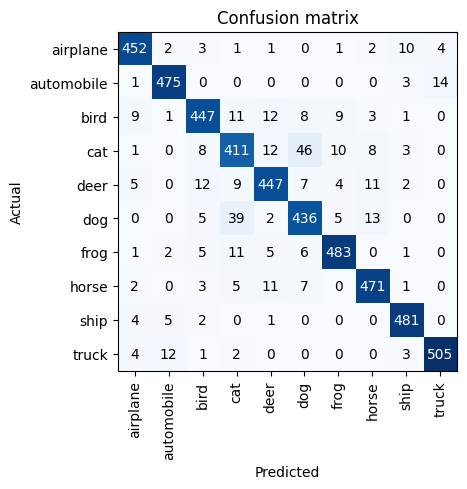

In [ ]:
interp_res34 = ClassificationInterpretation.from_learner(learn_res34) #Interpretar y visualizar resultados
interp_res34.plot_confusion_matrix() #Matriz de confusión

## Dataset de Test

In [ ]:
#Buscar el dataset de test en el drive y extraer los archivos
ruta_drive_2 = '/content/drive/MyDrive/Colab Notebooks/MSc_Data_Science/AML/Deep_learning/test_unlabelled.zip'
ruta_colab_2 = '/content/test_unlabelled.zip'
shutil.copyfile(ruta_drive_2, ruta_colab_2)

path = '/content/'
shutil.unpack_archive(ruta_colab_2, path)

In [ ]:
#Predicción del conjunto de prueba
modelo_cargado = load_learner('/content/resnet34_model.pkl') #Cargar modelo guardado
ruta_test = '/content/test_unlabelled/' #Ruta de las imágenes de test
test_files = sorted(get_image_files(ruta_test), key=lambda x: int(os.path.basename(x).split('.')[0])) #Lista de imágenes de test ordenadas ascendentemente
test_dl = modelo_cargado.dls.test_dl(test_files) #Preprocesar imágenes de test
predictions, _ = modelo_cargado.get_preds(dl=test_dl) #Predicciones
etiquetas_predichas = [modelo_cargado.dls.vocab[pred.argmax()] for pred in predictions] #Etiquetas predichas para cada imagen

In [ ]:
nombres_archivos = [f.name for f in test_files] #Extraer nombres de imágenes

df_pred = pd.DataFrame({'nombre_archivo': nombres_archivos, 'etiqueta_predicha': etiquetas_predichas}) #DataFrame con nombres de imágenes y predicciones

ruta_csv_pred = '/content/predicciones_test_Acuna.csv' #Dirección
df_pred.to_csv(ruta_csv_pred, index=False, header=False) #Guardar en CSV
df_pred #Mostrar el df para ver como se ve el CSV

,nombre_archivo,etiqueta_predicha
0,0000.jpg,airplane
1,0001.jpg,deer
2,0002.jpg,cat
3,0003.jpg,cat
4,0004.jpg,automobile
...,...,...
9995,9995.jpg,ship
9996,9996.jpg,automobile
9997,9997.jpg,automobile
9998,9998.jpg,cat


## Conclusiones

Aunque no se mencionó, se intentó hacer pruebas y entrenar modelos como ResNet-50, DenseNet-121, EfficientNet-B0, InceptionV1, para compararlos con los entrenados en este proyecto, pero cada uno de ellos fue descartado por falta de memoria RAM de GPU brindada por la versión gratuita de Colab, ya que consumían mucho.

De los modelos entrenados, el modelo ResNet-34 fue el mejor, ya que, presentó la mayor accuracy, el menor valid loss y un buen rendimiento en precisión y recall para cada clase. Además que su matriz de confusión es la que presenta mayor número de aciertos y menor cantidad de errores. Esto sugiere que el modelo ResNet-34 es capaz de hacer predicciones precisas y generalizadas para una variedad de clases en el dataset CIFAR-10.

La clasificación de imágenes es una tarea fundamental en el campo del Machine Learning y la Inteligencia Artificial, ya que, permite a las máquinas comprender y categorizar el contenido visual, lo que tiene aplicaciones en una amplia gama de áreas, como; reconocimiento de objetos, diagnóstico médico, conducción autónoma, seguridad, vigilancia, entre otros.

Los modelos de Deep Learning, como; las CNN (Redes Neuronales Convolucionales), han demostrado ser altamente efectivos en la clasificación de imágenes, estos modelos son capaces de aprender automáticamente características y patrones directamente de las imágenes, lo que les permite realizar tareas de clasificación con una alta precisión. Además, arquitecturas como ResNet, VGG y otras han mejorado aún más el rendimiento de los modelos de clasificación de imágenes en comparación con modelos creados desde cero.